# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [2]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

ModuleNotFoundError: No module named 'tensorflow'

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

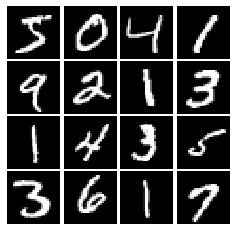

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [7]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    leaky = tf.maximum(alpha*x,x)
    return leaky

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [8]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [9]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise = tf.random_uniform_initializer(-1,1)
    noise = noise(shape = (batch_size, dim))
    return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [10]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [27]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer((784,)),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [28]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [35]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer((noise_dim,)),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, activation = 'tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [36]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [37]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    real_loss = bce(tf.ones_like(logits_real),logits_real)
    fake_loss = bce(tf.zeros_like(logits_fake),logits_fake)
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    loss = bce(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [38]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [39]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [40]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [41]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 0.9847, G:0.7758


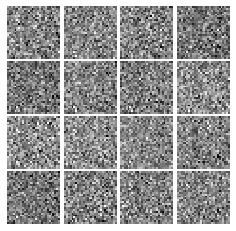

Epoch: 0, Iter: 20, D: 0.5901, G:0.9458


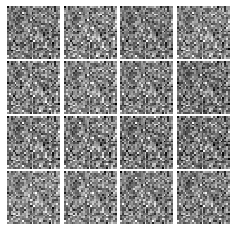

Epoch: 0, Iter: 40, D: 0.3857, G:1.356


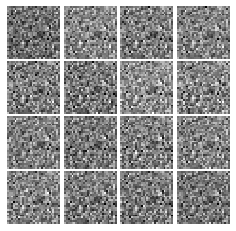

Epoch: 0, Iter: 60, D: 0.1069, G:3.211


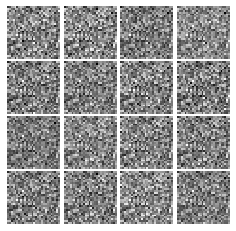

Epoch: 0, Iter: 80, D: 1.332, G:11.74


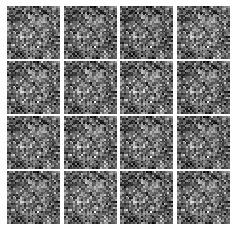

Epoch: 0, Iter: 100, D: 1.919, G:2.663


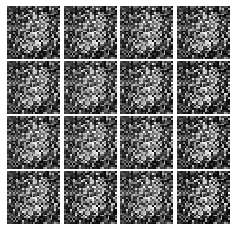

Epoch: 0, Iter: 120, D: 1.34, G:0.8441


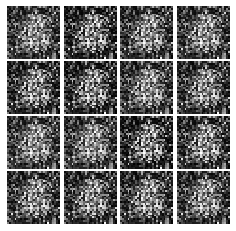

Epoch: 0, Iter: 140, D: 1.425, G:1.293


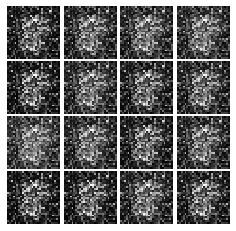

Epoch: 0, Iter: 160, D: 1.521, G:0.7677


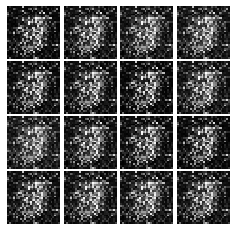

Epoch: 0, Iter: 180, D: 1.396, G:1.195


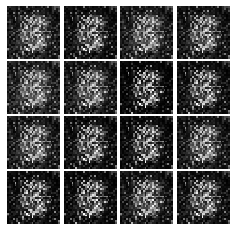

Epoch: 0, Iter: 200, D: 1.901, G:0.6769


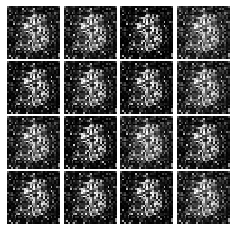

Epoch: 0, Iter: 220, D: 1.398, G:0.878


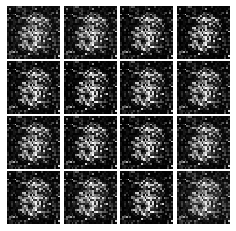

Epoch: 0, Iter: 240, D: 1.094, G:1.166


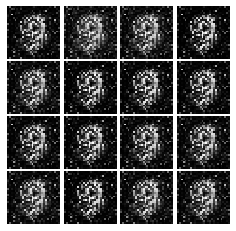

Epoch: 0, Iter: 260, D: 1.143, G:1.277


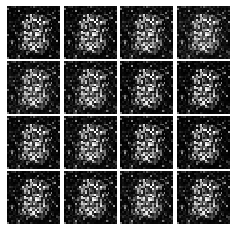

Epoch: 0, Iter: 280, D: 1.228, G:0.9706


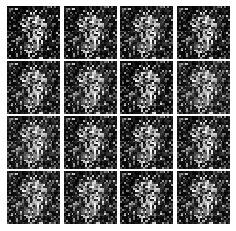

Epoch: 0, Iter: 300, D: 1.403, G:1.885


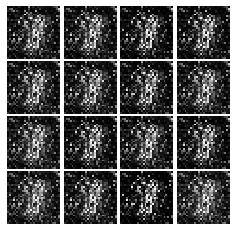

Epoch: 0, Iter: 320, D: 2.075, G:0.6882


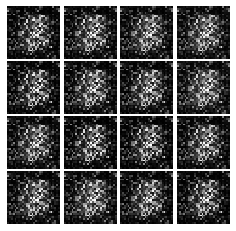

Epoch: 0, Iter: 340, D: 1.015, G:1.205


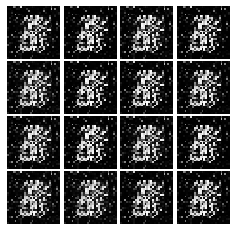

Epoch: 0, Iter: 360, D: 1.575, G:0.6594


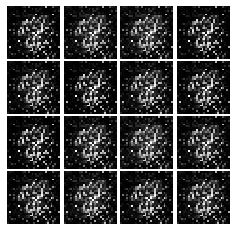

Epoch: 0, Iter: 380, D: 1.028, G:1.111


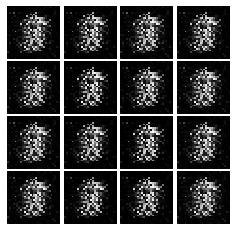

Epoch: 0, Iter: 400, D: 1.525, G:0.8233


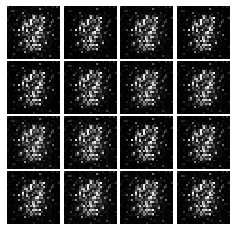

Epoch: 0, Iter: 420, D: 1.187, G:1.012


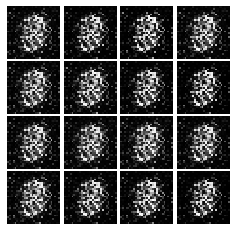

Epoch: 0, Iter: 440, D: 1.138, G:1.051


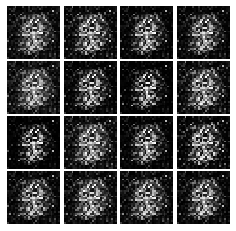

Epoch: 0, Iter: 460, D: 1.687, G:0.738


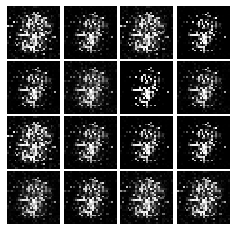

Epoch: 1, Iter: 480, D: 1.134, G:1.197


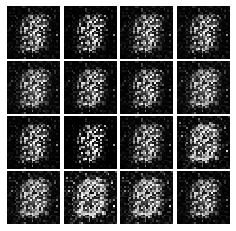

Epoch: 1, Iter: 500, D: 1.361, G:1.621


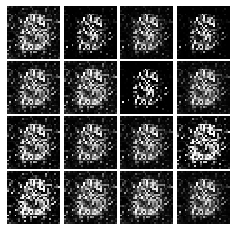

Epoch: 1, Iter: 520, D: 1.151, G:1.296


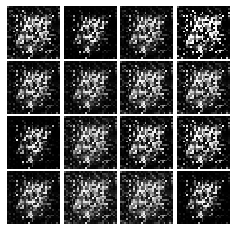

Epoch: 1, Iter: 540, D: 1.358, G:1.051


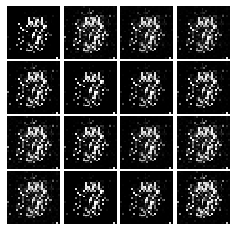

Epoch: 1, Iter: 560, D: 1.275, G:1.01


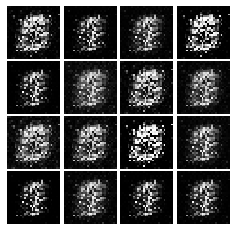

Epoch: 1, Iter: 580, D: 1.953, G:0.697


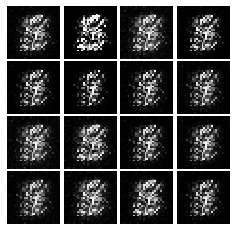

Epoch: 1, Iter: 600, D: 1.269, G:1.083


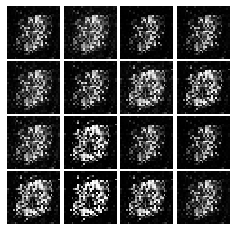

Epoch: 1, Iter: 620, D: 1.664, G:0.6145


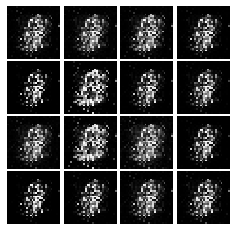

Epoch: 1, Iter: 640, D: 1.408, G:0.5293


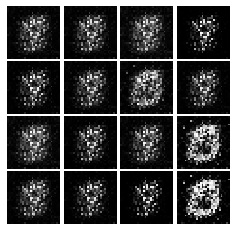

Epoch: 1, Iter: 660, D: 1.592, G:0.8755


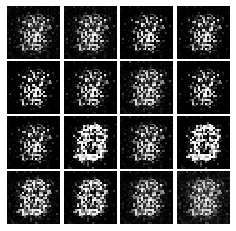

Epoch: 1, Iter: 680, D: 3.236, G:1.656


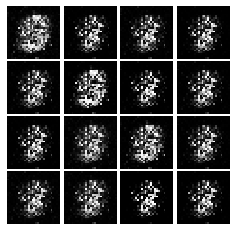

Epoch: 1, Iter: 700, D: 1.29, G:0.7965


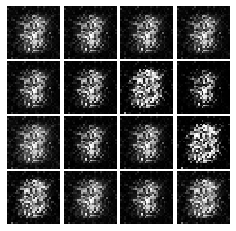

Epoch: 1, Iter: 720, D: 1.223, G:0.5671


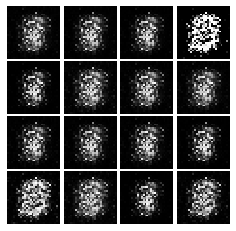

Epoch: 1, Iter: 740, D: 1.255, G:1.06


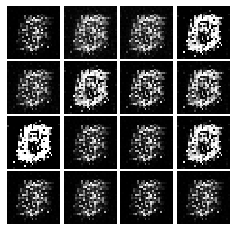

Epoch: 1, Iter: 760, D: 1.033, G:1.177


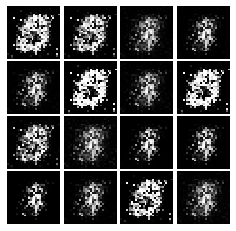

Epoch: 1, Iter: 780, D: 1.489, G:1.046


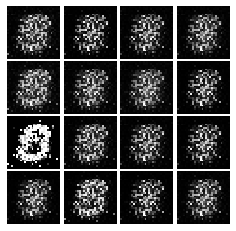

Epoch: 1, Iter: 800, D: 1.56, G:0.773


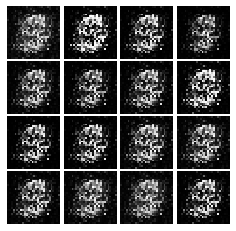

Epoch: 1, Iter: 820, D: 1.134, G:0.9298


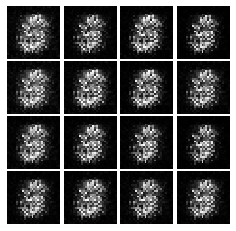

Epoch: 1, Iter: 840, D: 1.248, G:0.8029


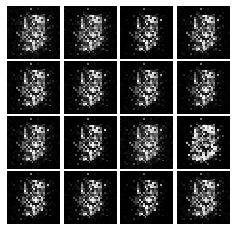

Epoch: 1, Iter: 860, D: 1.789, G:0.8212


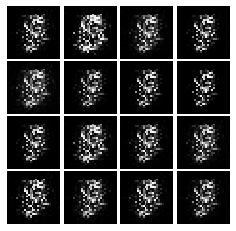

Epoch: 1, Iter: 880, D: 1.259, G:0.8254


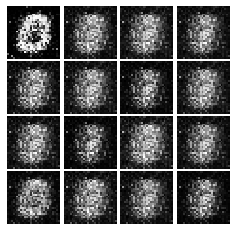

Epoch: 1, Iter: 900, D: 1.343, G:1.345


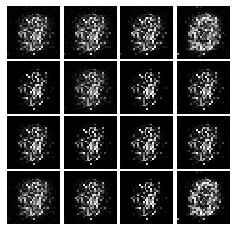

Epoch: 1, Iter: 920, D: 1.15, G:0.9883


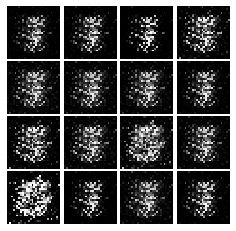

Epoch: 2, Iter: 940, D: 1.159, G:1.101


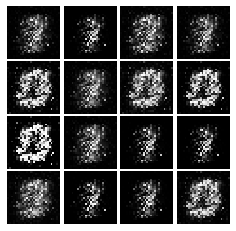

Epoch: 2, Iter: 960, D: 1.342, G:1.077


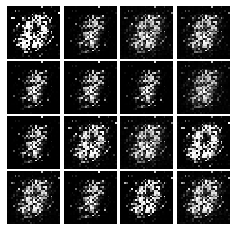

Epoch: 2, Iter: 980, D: 1.357, G:2.235


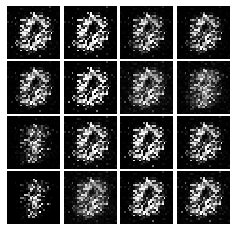

Epoch: 2, Iter: 1000, D: 1.471, G:0.9307


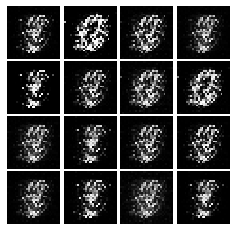

Epoch: 2, Iter: 1020, D: 1.433, G:0.6001


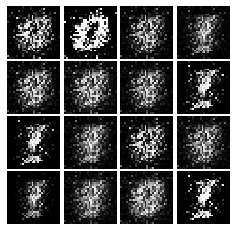

Epoch: 2, Iter: 1040, D: 1.177, G:3.601


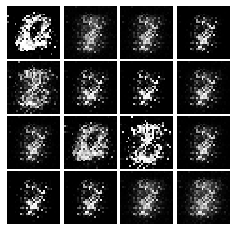

Epoch: 2, Iter: 1060, D: 1.312, G:0.9256


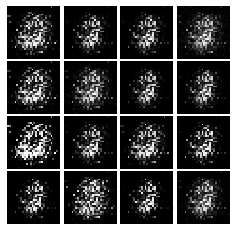

Epoch: 2, Iter: 1080, D: 1.055, G:1.265


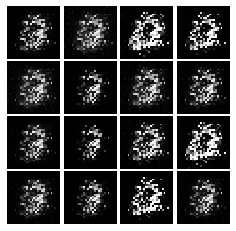

Epoch: 2, Iter: 1100, D: 1.243, G:1.324


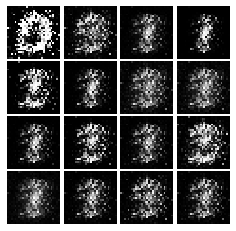

Epoch: 2, Iter: 1120, D: 1.362, G:1.953


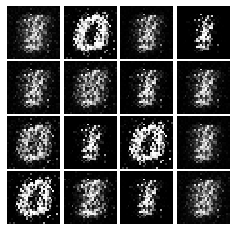

Epoch: 2, Iter: 1140, D: 1.321, G:1.063


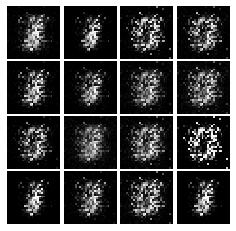

Epoch: 2, Iter: 1160, D: 1.308, G:1.135


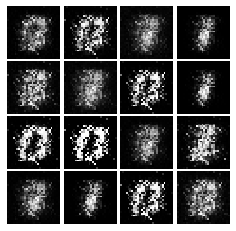

Epoch: 2, Iter: 1180, D: 1.343, G:0.9379


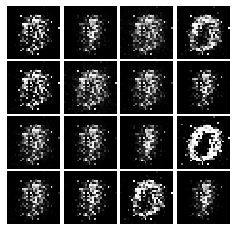

Epoch: 2, Iter: 1200, D: 1.422, G:0.5885


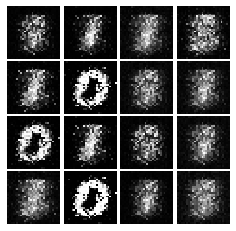

Epoch: 2, Iter: 1220, D: 1.336, G:1.217


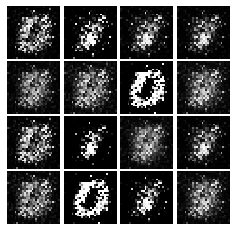

Epoch: 2, Iter: 1240, D: 1.314, G:1.151


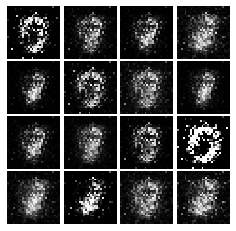

Epoch: 2, Iter: 1260, D: 1.218, G:1.026


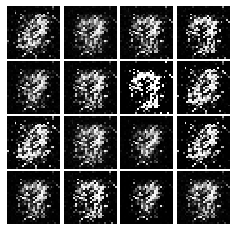

Epoch: 2, Iter: 1280, D: 1.506, G:1.208


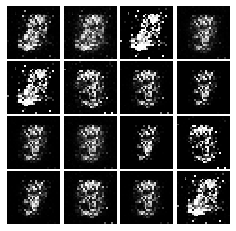

Epoch: 2, Iter: 1300, D: 1.154, G:1.106


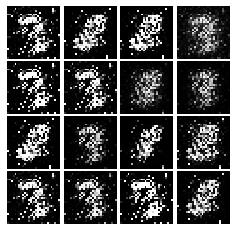

Epoch: 2, Iter: 1320, D: 1.689, G:2.956


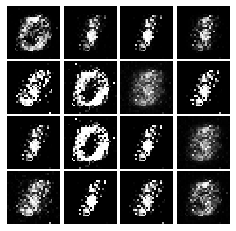

Epoch: 2, Iter: 1340, D: 1.289, G:0.9745


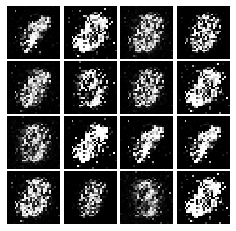

Epoch: 2, Iter: 1360, D: 1.407, G:0.8728


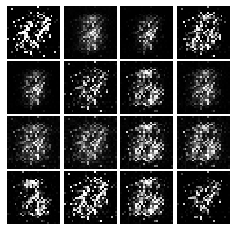

Epoch: 2, Iter: 1380, D: 1.165, G:1.303


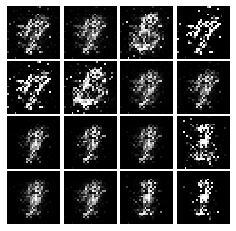

Epoch: 2, Iter: 1400, D: 1.076, G:0.8244


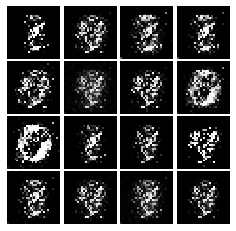

Epoch: 3, Iter: 1420, D: 1.496, G:1.135


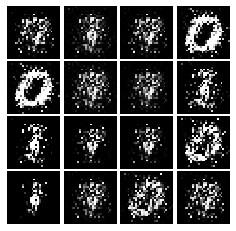

Epoch: 3, Iter: 1440, D: 1.263, G:1.587


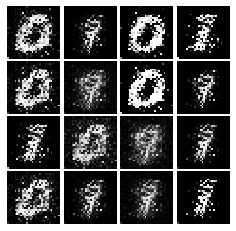

Epoch: 3, Iter: 1460, D: 1.225, G:1.223


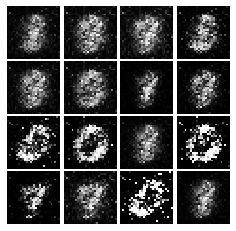

Epoch: 3, Iter: 1480, D: 1.297, G:0.9138


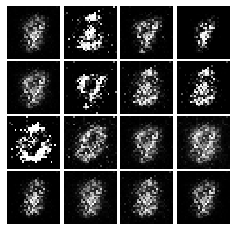

Epoch: 3, Iter: 1500, D: 1.358, G:0.9082


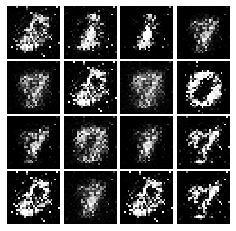

Epoch: 3, Iter: 1520, D: 1.242, G:0.8994


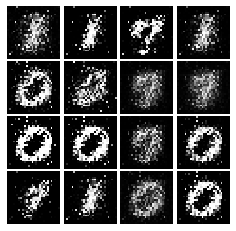

Epoch: 3, Iter: 1540, D: 1.193, G:0.9907


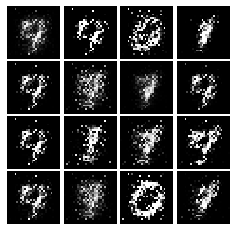

Epoch: 3, Iter: 1560, D: 1.665, G:1.042


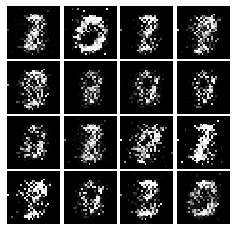

Epoch: 3, Iter: 1580, D: 1.269, G:0.6962


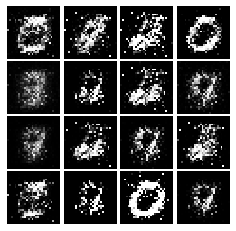

Epoch: 3, Iter: 1600, D: 1.07, G:1.076


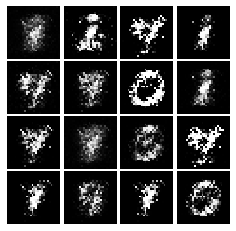

Epoch: 3, Iter: 1620, D: 1.382, G:0.8503


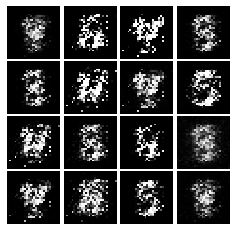

Epoch: 3, Iter: 1640, D: 1.122, G:1.041


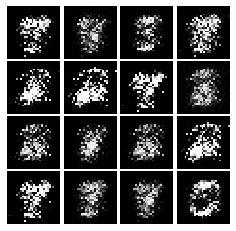

Epoch: 3, Iter: 1660, D: 1.471, G:1.024


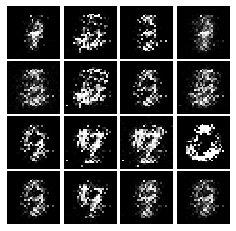

Epoch: 3, Iter: 1680, D: 0.8845, G:1.383


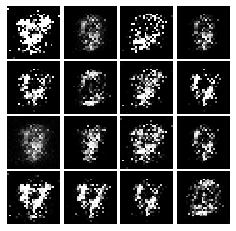

Epoch: 3, Iter: 1700, D: 1.214, G:1.641


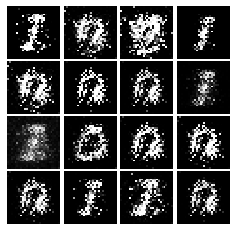

Epoch: 3, Iter: 1720, D: 1.153, G:1.607


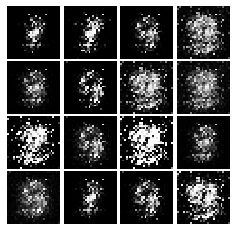

Epoch: 3, Iter: 1740, D: 1.368, G:0.8537


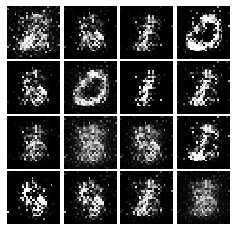

Epoch: 3, Iter: 1760, D: 1.09, G:2.402


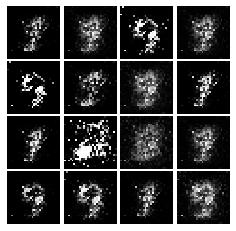

Epoch: 3, Iter: 1780, D: 1.491, G:0.7814


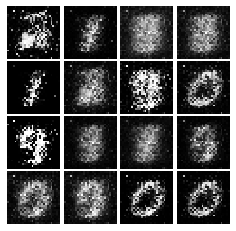

Epoch: 3, Iter: 1800, D: 1.119, G:0.9194


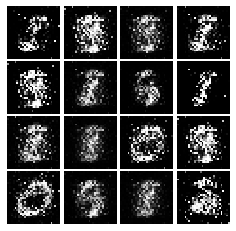

Epoch: 3, Iter: 1820, D: 1.427, G:0.8479


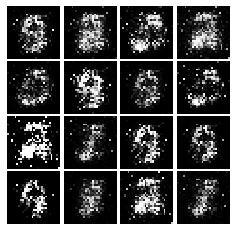

Epoch: 3, Iter: 1840, D: 1.27, G:1.01


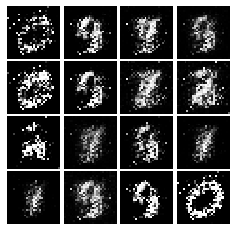

Epoch: 3, Iter: 1860, D: 1.429, G:0.8262


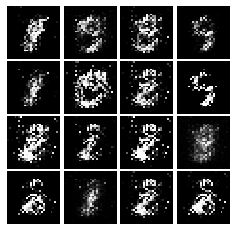

Epoch: 4, Iter: 1880, D: 1.193, G:1.029


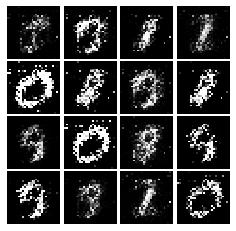

Epoch: 4, Iter: 1900, D: 1.405, G:0.9072


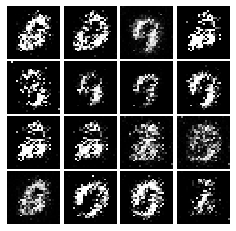

Epoch: 4, Iter: 1920, D: 1.253, G:0.8982


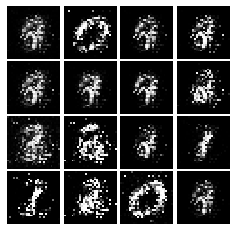

Epoch: 4, Iter: 1940, D: 1.385, G:0.8168


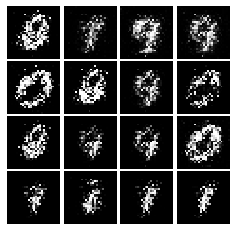

Epoch: 4, Iter: 1960, D: 1.266, G:0.9469


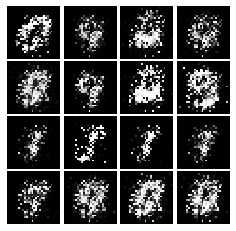

Epoch: 4, Iter: 1980, D: 1.282, G:0.8108


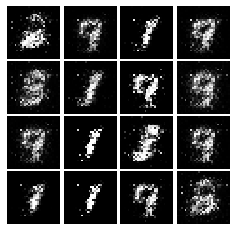

Epoch: 4, Iter: 2000, D: 1.418, G:0.8094


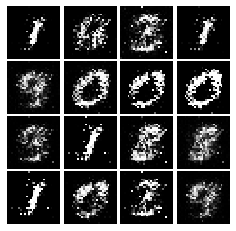

Epoch: 4, Iter: 2020, D: 1.378, G:0.7242


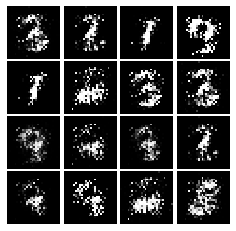

Epoch: 4, Iter: 2040, D: 1.287, G:0.7312


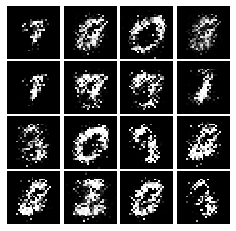

Epoch: 4, Iter: 2060, D: 1.385, G:0.7912


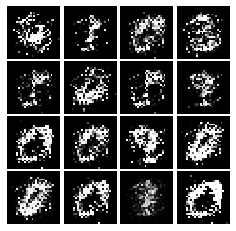

Epoch: 4, Iter: 2080, D: 1.339, G:0.9262


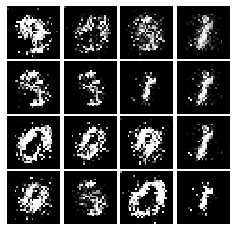

Epoch: 4, Iter: 2100, D: 1.28, G:0.9526


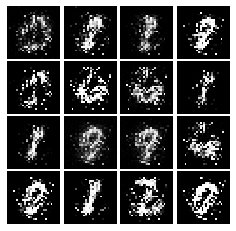

Epoch: 4, Iter: 2120, D: 1.33, G:0.7598


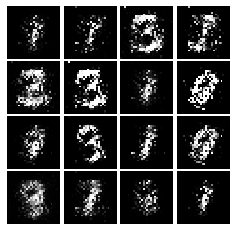

Epoch: 4, Iter: 2140, D: 1.443, G:0.9602


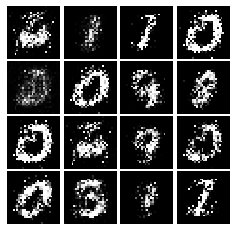

Epoch: 4, Iter: 2160, D: 1.345, G:0.7752


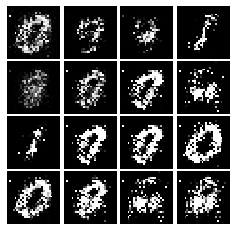

Epoch: 4, Iter: 2180, D: 1.256, G:0.7819


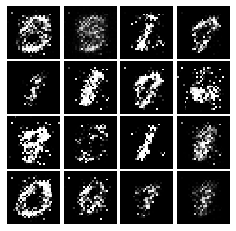

Epoch: 4, Iter: 2200, D: 1.263, G:0.8568


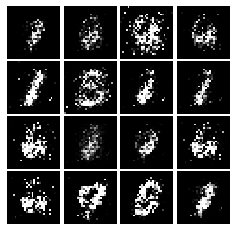

Epoch: 4, Iter: 2220, D: 1.528, G:0.7133


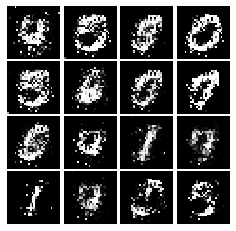

Epoch: 4, Iter: 2240, D: 1.32, G:1.188


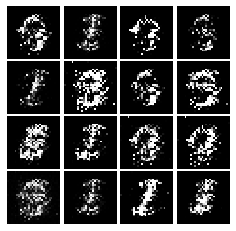

Epoch: 4, Iter: 2260, D: 1.351, G:0.8208


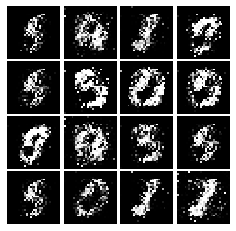

Epoch: 4, Iter: 2280, D: 2.231, G:0.3909


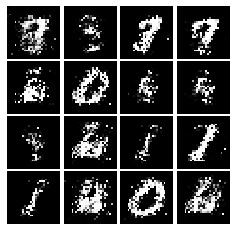

Epoch: 4, Iter: 2300, D: 1.291, G:0.839


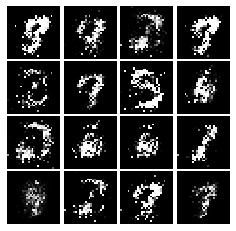

Epoch: 4, Iter: 2320, D: 1.256, G:1.02


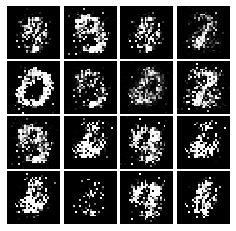

Epoch: 4, Iter: 2340, D: 2.107, G:0.9753


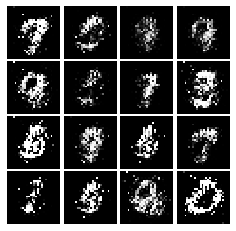

Epoch: 5, Iter: 2360, D: 1.287, G:0.8374


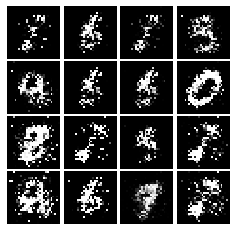

Epoch: 5, Iter: 2380, D: 1.18, G:0.9416


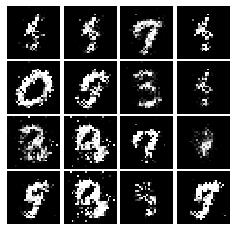

Epoch: 5, Iter: 2400, D: 1.242, G:0.7844


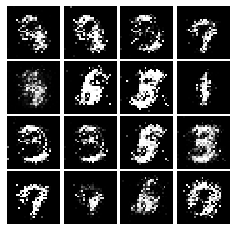

Epoch: 5, Iter: 2420, D: 1.285, G:1.604


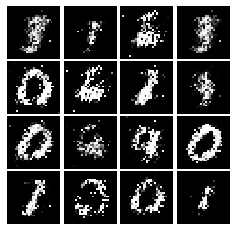

Epoch: 5, Iter: 2440, D: 1.07, G:2.098


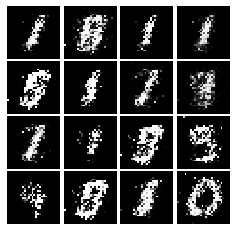

Epoch: 5, Iter: 2460, D: 1.265, G:0.9384


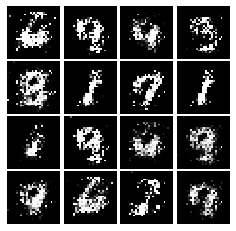

Epoch: 5, Iter: 2480, D: 1.256, G:0.8902


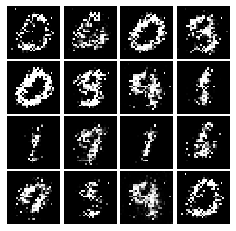

Epoch: 5, Iter: 2500, D: 1.122, G:1.112


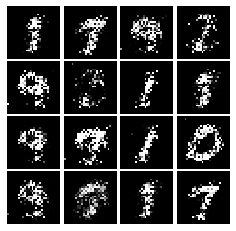

Epoch: 5, Iter: 2520, D: 1.343, G:0.664


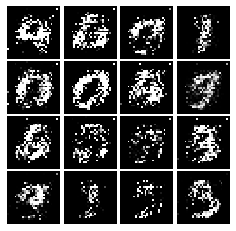

Epoch: 5, Iter: 2540, D: 1.133, G:0.9985


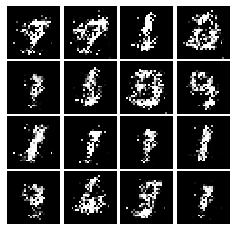

Epoch: 5, Iter: 2560, D: 1.319, G:0.9355


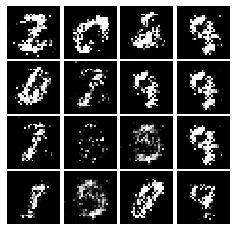

Epoch: 5, Iter: 2580, D: 1.196, G:0.9429


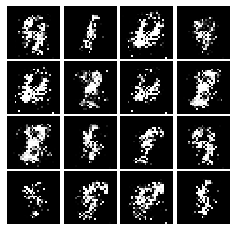

Epoch: 5, Iter: 2600, D: 1.493, G:2.619


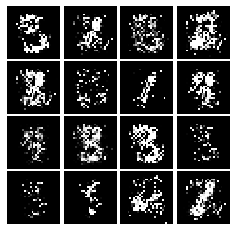

Epoch: 5, Iter: 2620, D: 1.205, G:0.9587


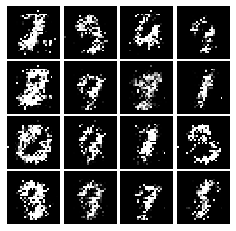

Epoch: 5, Iter: 2640, D: 1.181, G:1.053


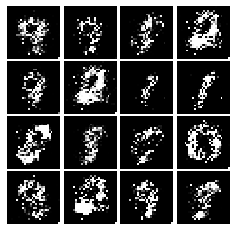

Epoch: 5, Iter: 2660, D: 1.296, G:1.232


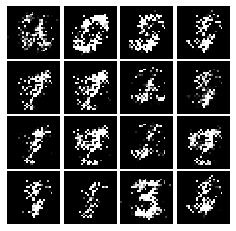

Epoch: 5, Iter: 2680, D: 1.314, G:0.8782


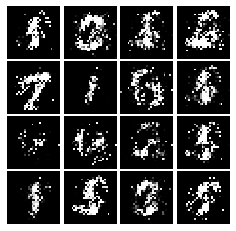

Epoch: 5, Iter: 2700, D: 1.412, G:0.929


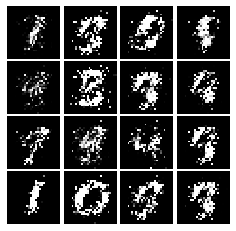

Epoch: 5, Iter: 2720, D: 1.259, G:0.8845


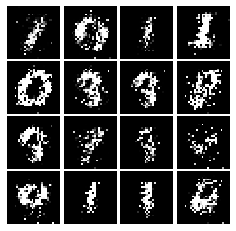

Epoch: 5, Iter: 2740, D: 1.214, G:1.005


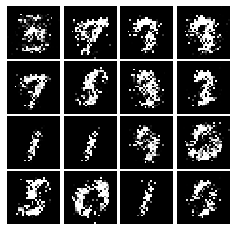

Epoch: 5, Iter: 2760, D: 1.225, G:1.069


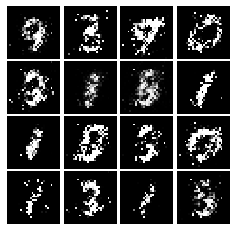

Epoch: 5, Iter: 2780, D: 1.161, G:1.038


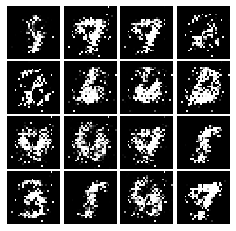

Epoch: 5, Iter: 2800, D: 1.234, G:1.082


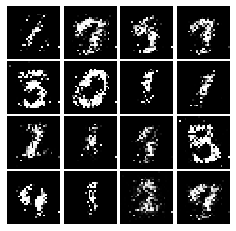

Epoch: 6, Iter: 2820, D: 1.321, G:0.8923


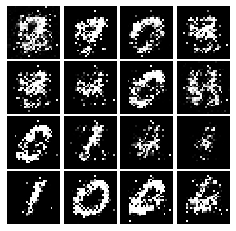

Epoch: 6, Iter: 2840, D: 1.259, G:0.7879


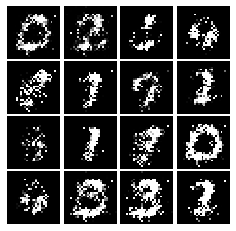

Epoch: 6, Iter: 2860, D: 1.252, G:0.8731


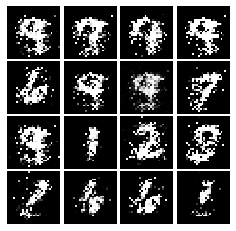

Epoch: 6, Iter: 2880, D: 1.29, G:1.105


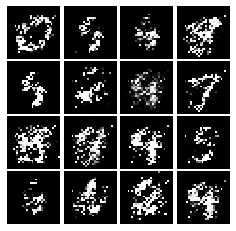

Epoch: 6, Iter: 2900, D: 1.562, G:0.6277


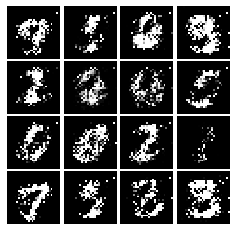

Epoch: 6, Iter: 2920, D: 1.453, G:0.92


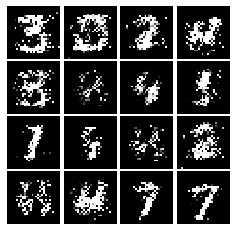

Epoch: 6, Iter: 2940, D: 1.266, G:0.6929


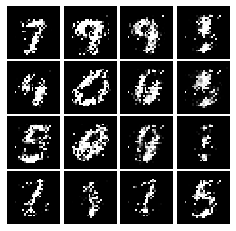

Epoch: 6, Iter: 2960, D: 1.415, G:0.8011


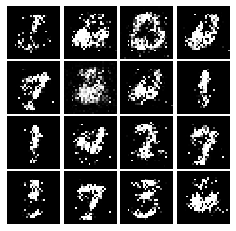

Epoch: 6, Iter: 2980, D: 1.441, G:0.8243


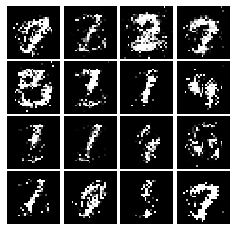

Epoch: 6, Iter: 3000, D: 1.061, G:1.19


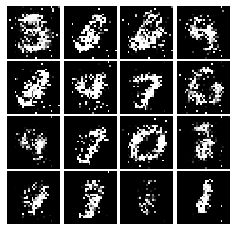

Epoch: 6, Iter: 3020, D: 1.221, G:0.8439


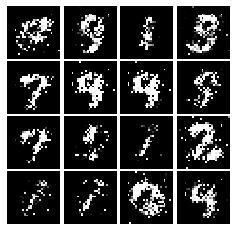

Epoch: 6, Iter: 3040, D: 1.05, G:1.069


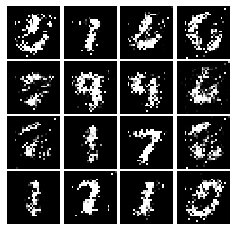

Epoch: 6, Iter: 3060, D: 1.285, G:0.9483


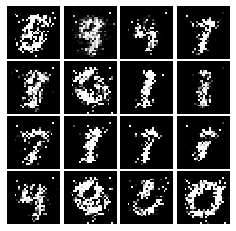

Epoch: 6, Iter: 3080, D: 1.313, G:0.8062


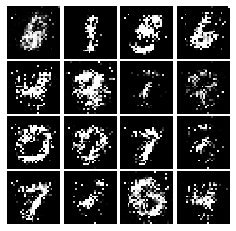

Epoch: 6, Iter: 3100, D: 1.24, G:0.9443


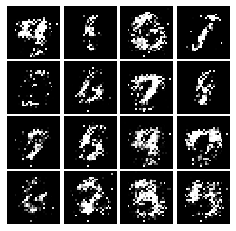

Epoch: 6, Iter: 3120, D: 1.262, G:0.9095


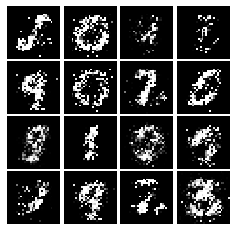

Epoch: 6, Iter: 3140, D: 1.447, G:0.9365


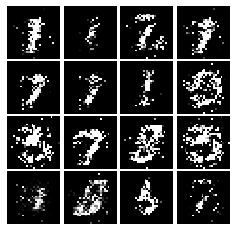

Epoch: 6, Iter: 3160, D: 1.155, G:1.35


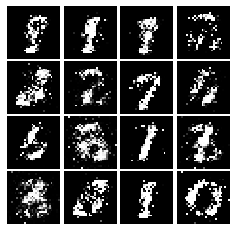

Epoch: 6, Iter: 3180, D: 1.128, G:1.025


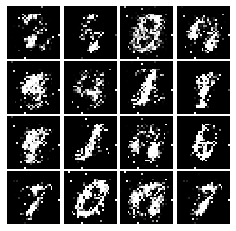

Epoch: 6, Iter: 3200, D: 1.167, G:1.11


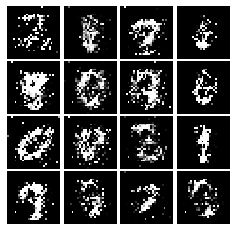

Epoch: 6, Iter: 3220, D: 1.174, G:1.146


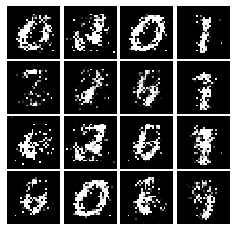

Epoch: 6, Iter: 3240, D: 1.323, G:0.9565


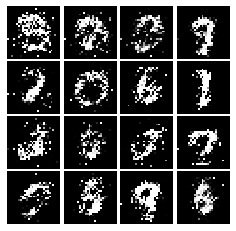

Epoch: 6, Iter: 3260, D: 1.362, G:0.9701


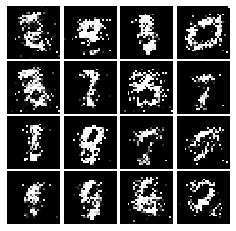

Epoch: 6, Iter: 3280, D: 1.36, G:1.042


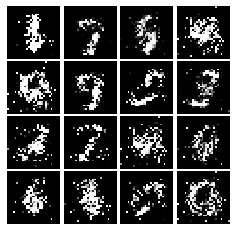

Epoch: 7, Iter: 3300, D: 0.9866, G:1.552


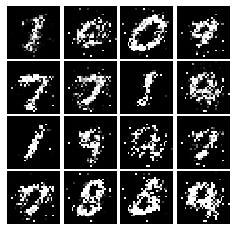

Epoch: 7, Iter: 3320, D: 1.2, G:0.9468


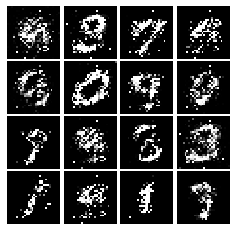

Epoch: 7, Iter: 3340, D: 1.069, G:1.202


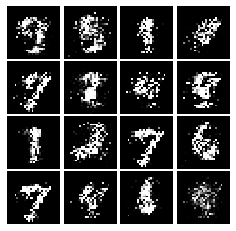

Epoch: 7, Iter: 3360, D: 1.44, G:0.7986


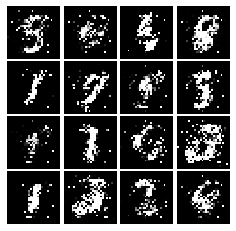

Epoch: 7, Iter: 3380, D: 1.27, G:0.8241


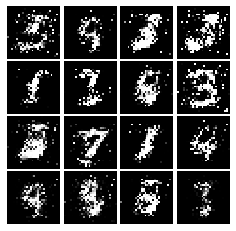

Epoch: 7, Iter: 3400, D: 1.401, G:0.9833


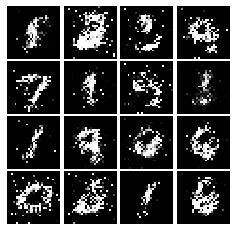

Epoch: 7, Iter: 3420, D: 1.364, G:0.9107


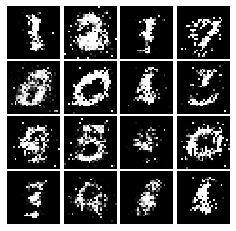

Epoch: 7, Iter: 3440, D: 1.5, G:0.9635


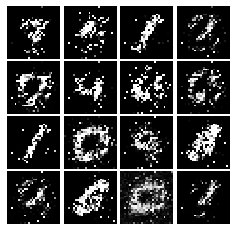

Epoch: 7, Iter: 3460, D: 1.273, G:1.08


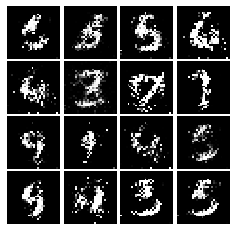

Epoch: 7, Iter: 3480, D: 1.292, G:0.789


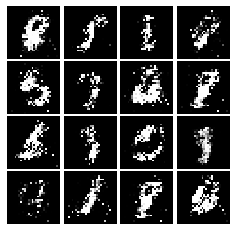

Epoch: 7, Iter: 3500, D: 1.239, G:0.8783


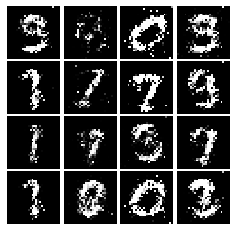

Epoch: 7, Iter: 3520, D: 1.352, G:0.764


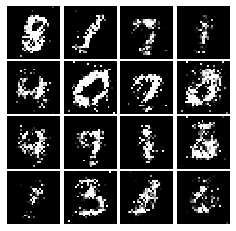

Epoch: 7, Iter: 3540, D: 1.209, G:1.054


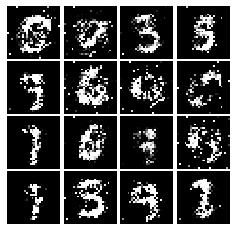

Epoch: 7, Iter: 3560, D: 1.194, G:0.8138


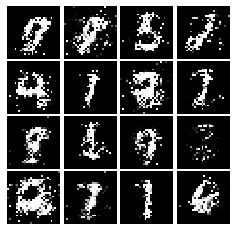

Epoch: 7, Iter: 3580, D: 1.282, G:0.9248


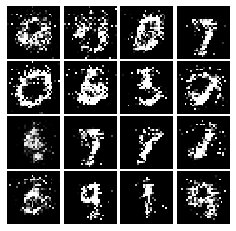

Epoch: 7, Iter: 3600, D: 1.291, G:0.8612


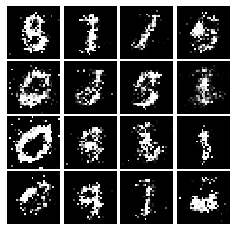

Epoch: 7, Iter: 3620, D: 1.301, G:0.9363


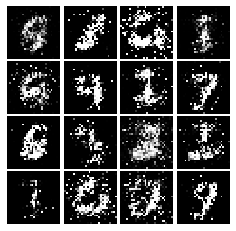

Epoch: 7, Iter: 3640, D: 1.314, G:0.9817


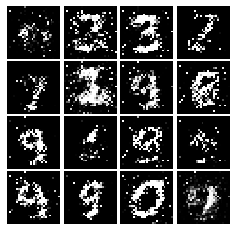

Epoch: 7, Iter: 3660, D: 1.196, G:1.204


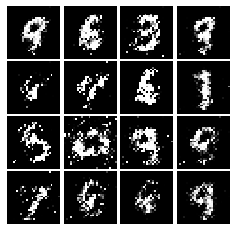

Epoch: 7, Iter: 3680, D: 1.404, G:0.8357


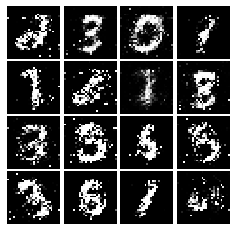

Epoch: 7, Iter: 3700, D: 1.214, G:1.052


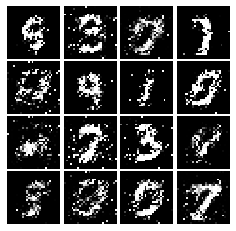

Epoch: 7, Iter: 3720, D: 1.422, G:0.8195


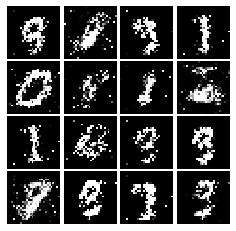

Epoch: 7, Iter: 3740, D: 1.345, G:0.5632


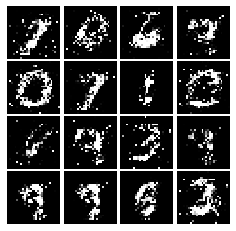

Epoch: 8, Iter: 3760, D: 1.373, G:0.8364


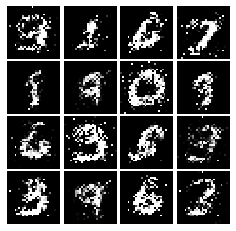

Epoch: 8, Iter: 3780, D: 1.286, G:0.842


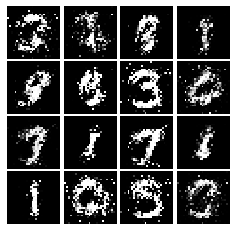

Epoch: 8, Iter: 3800, D: 1.264, G:0.9598


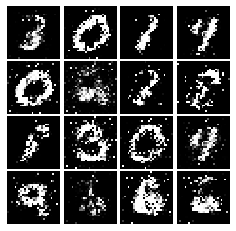

Epoch: 8, Iter: 3820, D: 1.451, G:0.8118


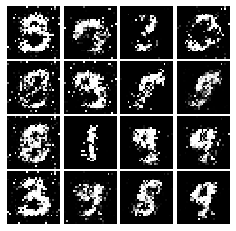

Epoch: 8, Iter: 3840, D: 1.374, G:0.8547


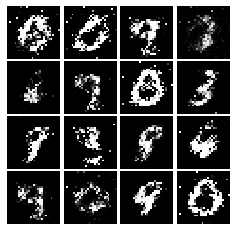

Epoch: 8, Iter: 3860, D: 1.393, G:0.8074


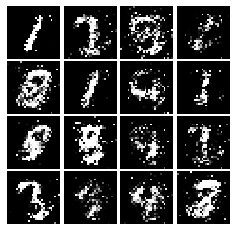

Epoch: 8, Iter: 3880, D: 1.246, G:0.8739


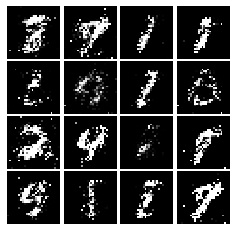

Epoch: 8, Iter: 3900, D: 1.483, G:0.676


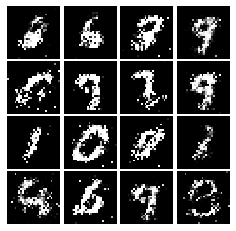

Epoch: 8, Iter: 3920, D: 1.373, G:0.8987


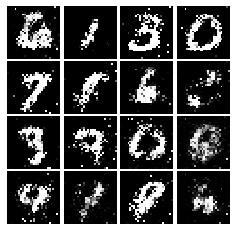

Epoch: 8, Iter: 3940, D: 1.382, G:0.8106


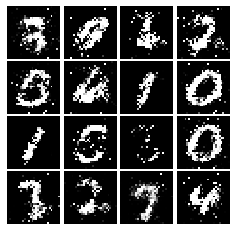

Epoch: 8, Iter: 3960, D: 1.306, G:0.772


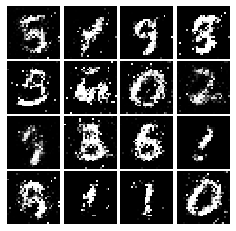

Epoch: 8, Iter: 3980, D: 1.354, G:0.7772


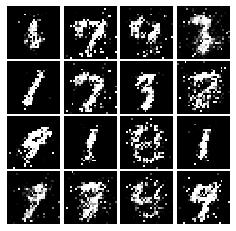

Epoch: 8, Iter: 4000, D: 1.317, G:0.7605


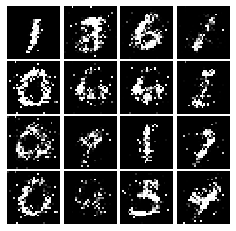

Epoch: 8, Iter: 4020, D: 1.367, G:0.817


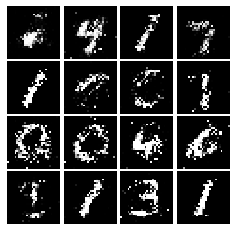

Epoch: 8, Iter: 4040, D: 1.341, G:0.7453


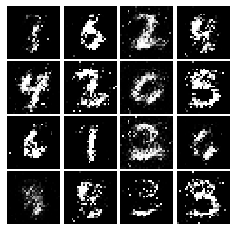

Epoch: 8, Iter: 4060, D: 1.362, G:0.7306


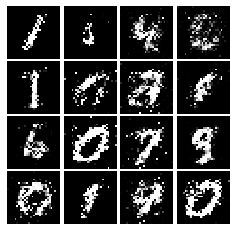

Epoch: 8, Iter: 4080, D: 1.445, G:0.7667


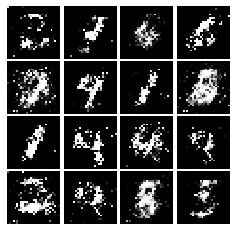

Epoch: 8, Iter: 4100, D: 1.332, G:0.789


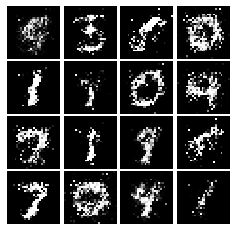

Epoch: 8, Iter: 4120, D: 1.354, G:0.8223


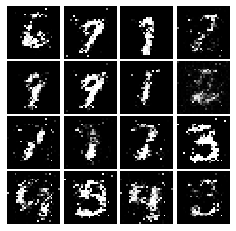

Epoch: 8, Iter: 4140, D: 1.402, G:0.8635


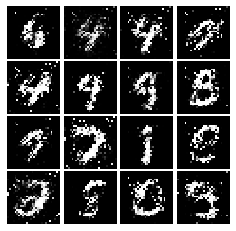

Epoch: 8, Iter: 4160, D: 1.386, G:0.7673


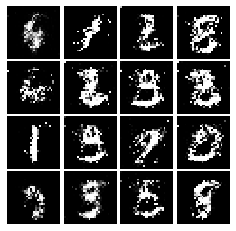

Epoch: 8, Iter: 4180, D: 1.342, G:0.7529


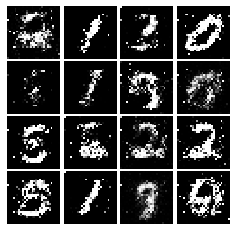

Epoch: 8, Iter: 4200, D: 1.317, G:0.8486


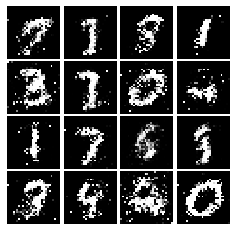

Epoch: 8, Iter: 4220, D: 1.372, G:0.7456


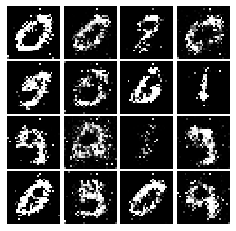

Epoch: 9, Iter: 4240, D: 1.366, G:0.8521


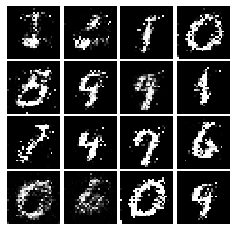

Epoch: 9, Iter: 4260, D: 1.373, G:0.7332


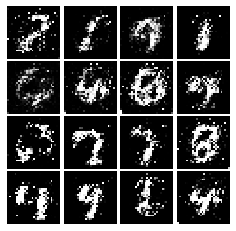

Epoch: 9, Iter: 4280, D: 1.405, G:0.7877


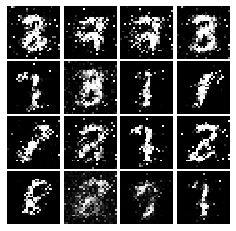

Epoch: 9, Iter: 4300, D: 1.395, G:0.8128


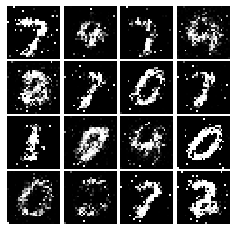

Epoch: 9, Iter: 4320, D: 1.413, G:0.7436


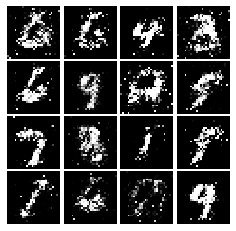

Epoch: 9, Iter: 4340, D: 1.377, G:0.7272


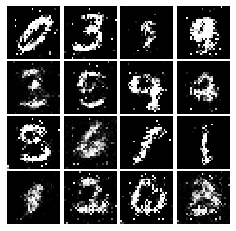

Epoch: 9, Iter: 4360, D: 1.355, G:0.7846


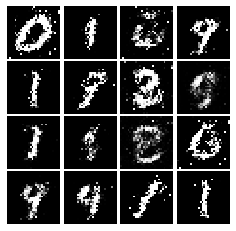

Epoch: 9, Iter: 4380, D: 1.386, G:0.7685


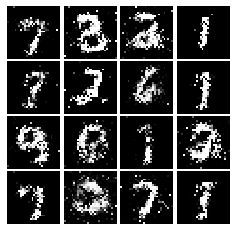

Epoch: 9, Iter: 4400, D: 1.241, G:0.8473


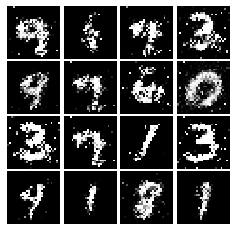

Epoch: 9, Iter: 4420, D: 1.283, G:0.7964


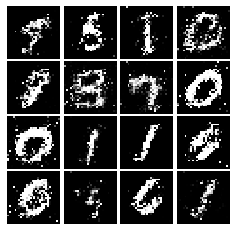

Epoch: 9, Iter: 4440, D: 1.292, G:0.8118


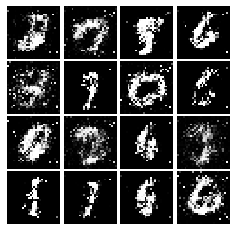

Epoch: 9, Iter: 4460, D: 1.325, G:0.7834


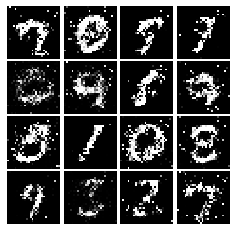

Epoch: 9, Iter: 4480, D: 1.354, G:0.8699


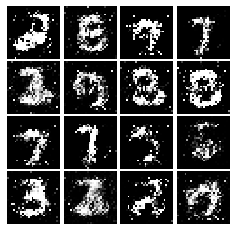

Epoch: 9, Iter: 4500, D: 1.374, G:0.7745


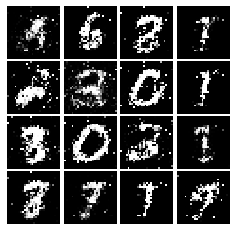

Epoch: 9, Iter: 4520, D: 1.311, G:1.078


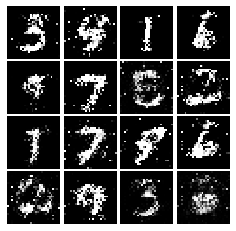

Epoch: 9, Iter: 4540, D: 1.365, G:0.7733


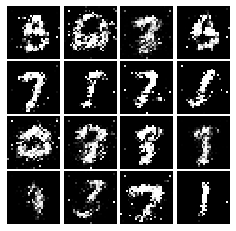

Epoch: 9, Iter: 4560, D: 1.338, G:0.7726


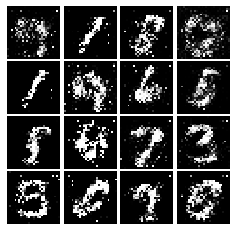

Epoch: 9, Iter: 4580, D: 1.311, G:1.184


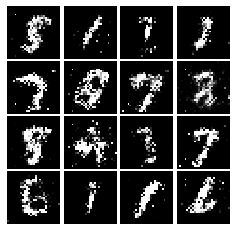

Epoch: 9, Iter: 4600, D: 1.413, G:0.7201


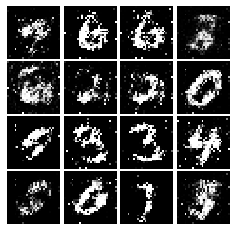

Epoch: 9, Iter: 4620, D: 1.327, G:0.7919


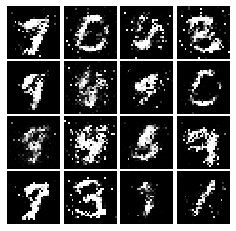

Epoch: 9, Iter: 4640, D: 1.326, G:0.6992


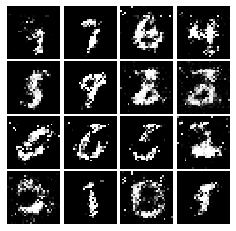

Epoch: 9, Iter: 4660, D: 1.365, G:0.821


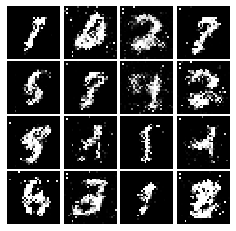

Epoch: 9, Iter: 4680, D: 1.361, G:0.7653


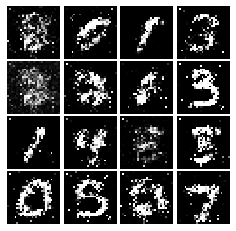

Final images


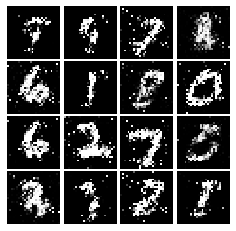

In [42]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [45]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * (tf.reduce_mean((scores_real-1)**2) + tf.reduce_mean(scores_fake**2))
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake-1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [46]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2003, G:0.6084


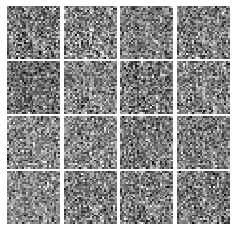

Epoch: 0, Iter: 20, D: 0.05403, G:1.107


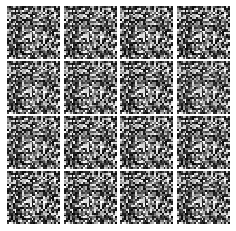

Epoch: 0, Iter: 40, D: 0.07415, G:1.248


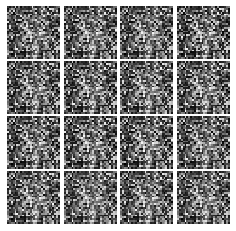

Epoch: 0, Iter: 60, D: 0.07614, G:1.165


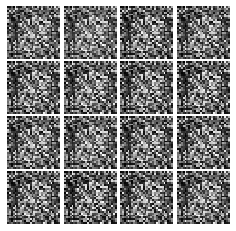

Epoch: 0, Iter: 80, D: 0.04087, G:0.5597


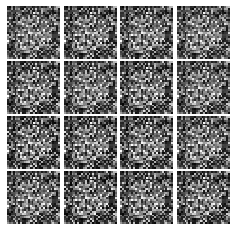

Epoch: 0, Iter: 100, D: 0.02123, G:0.5864


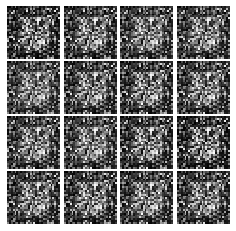

Epoch: 0, Iter: 120, D: 0.0277, G:0.7933


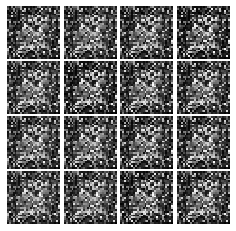

Epoch: 0, Iter: 140, D: 0.2107, G:0.3335


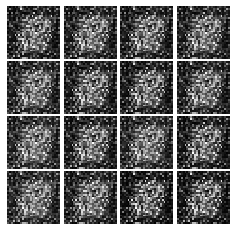

Epoch: 0, Iter: 160, D: 0.8916, G:2.573


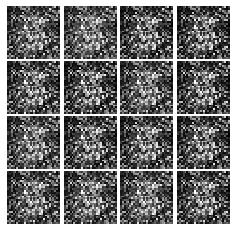

Epoch: 0, Iter: 180, D: 0.1408, G:0.3302


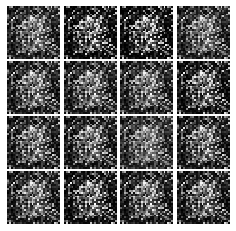

Epoch: 0, Iter: 200, D: 0.2172, G:0.162


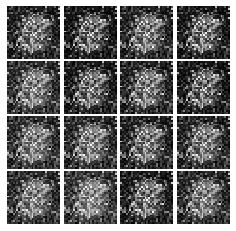

Epoch: 0, Iter: 220, D: 0.1171, G:0.5592


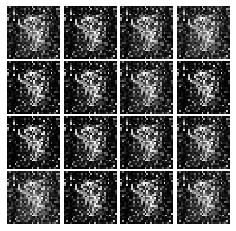

Epoch: 0, Iter: 240, D: 0.2102, G:0.9793


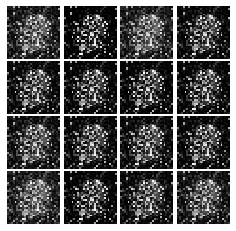

Epoch: 0, Iter: 260, D: 0.2586, G:0.1783


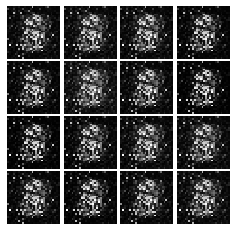

Epoch: 0, Iter: 280, D: 0.1699, G:0.6195


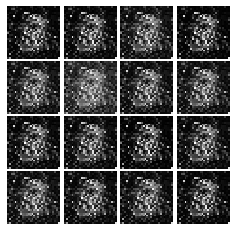

Epoch: 0, Iter: 300, D: 0.1133, G:0.3109


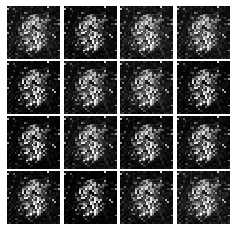

Epoch: 0, Iter: 320, D: 0.1242, G:0.4226


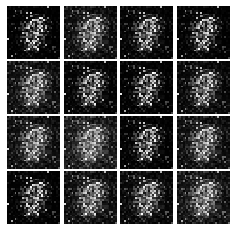

Epoch: 0, Iter: 340, D: 0.0954, G:0.5078


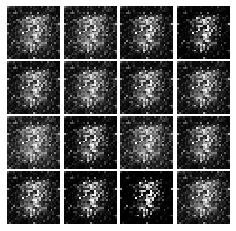

Epoch: 0, Iter: 360, D: 0.2191, G:0.8606


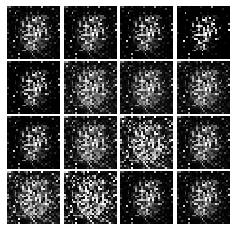

Epoch: 0, Iter: 380, D: 0.1257, G:0.5337


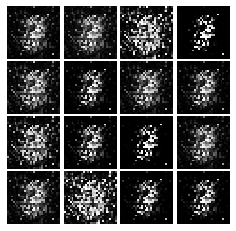

Epoch: 0, Iter: 400, D: 0.1568, G:0.413


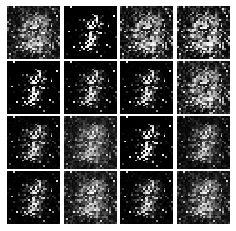

Epoch: 0, Iter: 420, D: 0.0752, G:0.4812


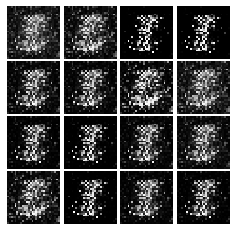

Epoch: 0, Iter: 440, D: 0.2126, G:0.297


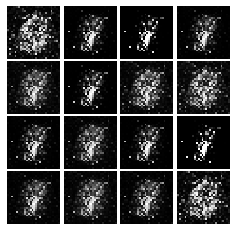

Epoch: 0, Iter: 460, D: 0.1574, G:0.4541


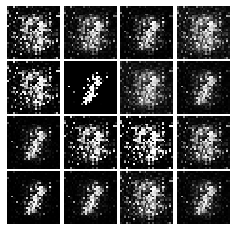

Epoch: 1, Iter: 480, D: 0.1559, G:0.4057


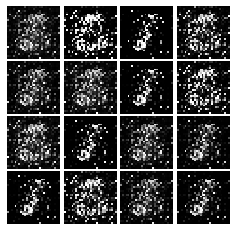

Epoch: 1, Iter: 500, D: 0.1916, G:0.593


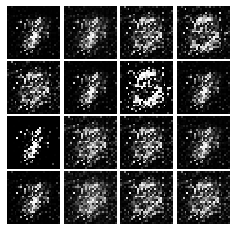

Epoch: 1, Iter: 520, D: 0.07577, G:0.5177


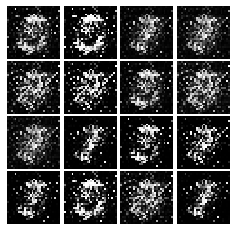

Epoch: 1, Iter: 540, D: 0.1112, G:0.3396


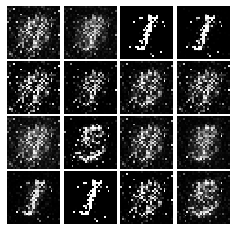

Epoch: 1, Iter: 560, D: 0.1524, G:0.2789


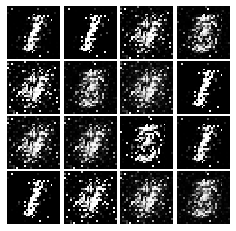

Epoch: 1, Iter: 580, D: 0.1113, G:0.5733


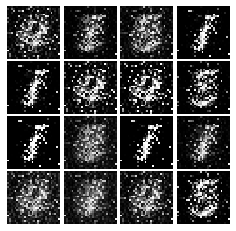

Epoch: 1, Iter: 600, D: 0.1218, G:0.339


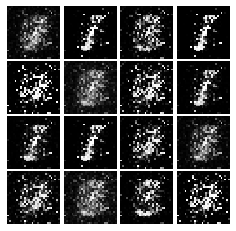

Epoch: 1, Iter: 620, D: 0.3598, G:0.03358


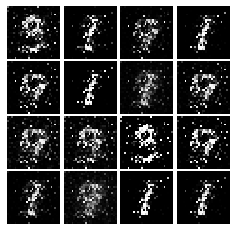

Epoch: 1, Iter: 640, D: 0.06651, G:0.4968


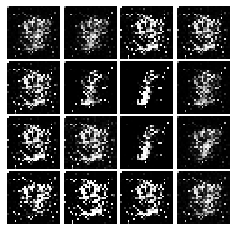

Epoch: 1, Iter: 660, D: 0.1579, G:0.8969


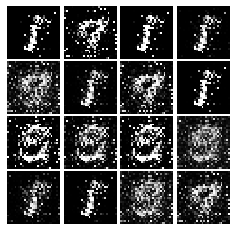

Epoch: 1, Iter: 680, D: 0.1338, G:0.2784


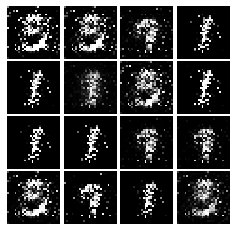

Epoch: 1, Iter: 700, D: 0.1009, G:0.4295


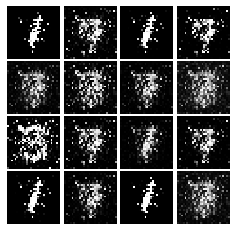

Epoch: 1, Iter: 720, D: 0.1223, G:0.4414


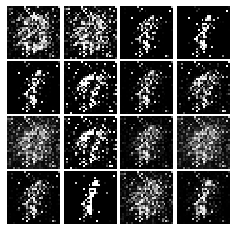

Epoch: 1, Iter: 740, D: 0.1353, G:0.5464


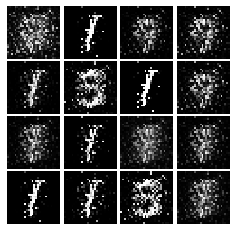

Epoch: 1, Iter: 760, D: 0.122, G:0.2889


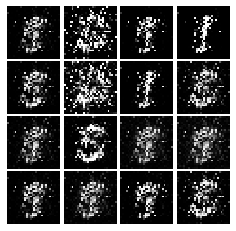

Epoch: 1, Iter: 780, D: 0.1007, G:0.269


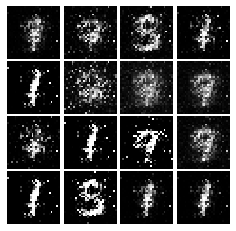

Epoch: 1, Iter: 800, D: 0.168, G:0.2847


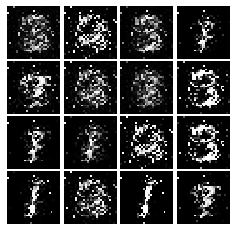

Epoch: 1, Iter: 820, D: 0.9044, G:0.06504


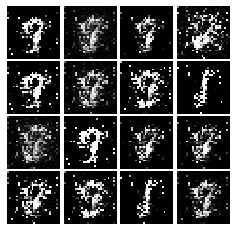

Epoch: 1, Iter: 840, D: 0.1448, G:0.3762


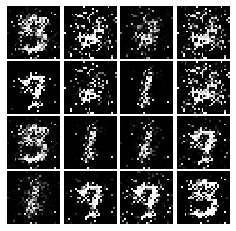

Epoch: 1, Iter: 860, D: 0.09659, G:0.4746


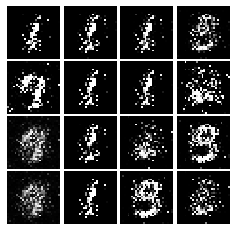

Epoch: 1, Iter: 880, D: 0.1131, G:0.3416


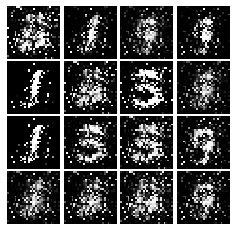

Epoch: 1, Iter: 900, D: 0.1327, G:0.2735


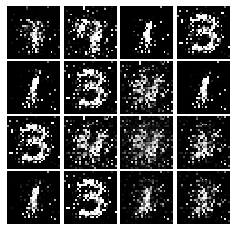

Epoch: 1, Iter: 920, D: 0.1266, G:0.3095


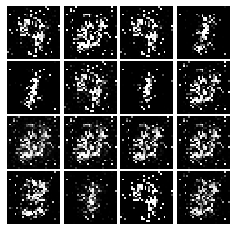

Epoch: 2, Iter: 940, D: 0.1111, G:0.4114


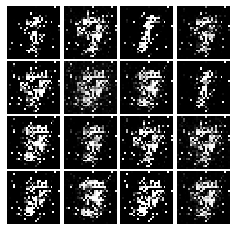

Epoch: 2, Iter: 960, D: 0.132, G:0.5386


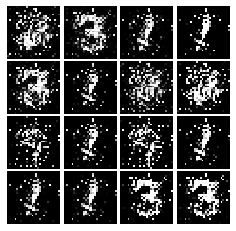

Epoch: 2, Iter: 980, D: 0.1247, G:0.435


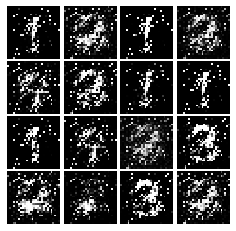

Epoch: 2, Iter: 1000, D: 0.08677, G:0.3871


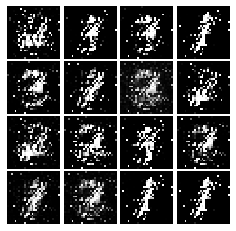

Epoch: 2, Iter: 1020, D: 0.1259, G:0.3323


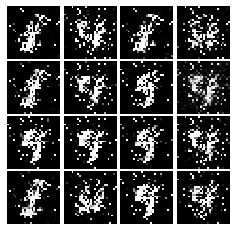

Epoch: 2, Iter: 1040, D: 0.09943, G:0.4458


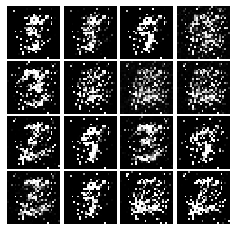

Epoch: 2, Iter: 1060, D: 0.05207, G:0.4339


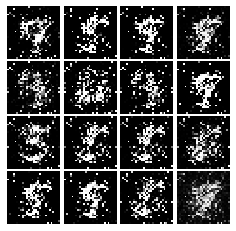

Epoch: 2, Iter: 1080, D: 0.1282, G:0.6747


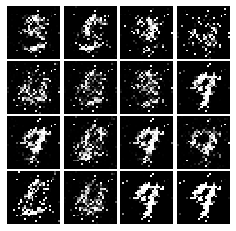

Epoch: 2, Iter: 1100, D: 0.07936, G:0.3922


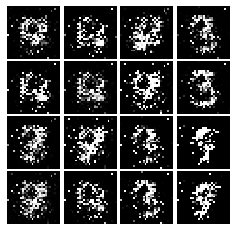

Epoch: 2, Iter: 1120, D: 0.1672, G:0.2791


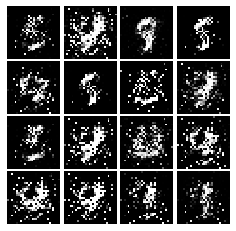

Epoch: 2, Iter: 1140, D: 0.1947, G:0.4241


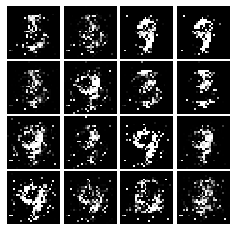

Epoch: 2, Iter: 1160, D: 0.1337, G:0.2874


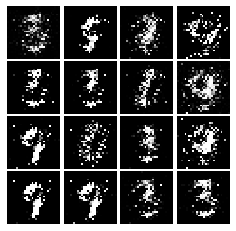

Epoch: 2, Iter: 1180, D: 0.1725, G:0.2546


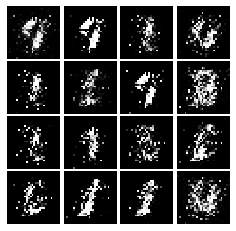

Epoch: 2, Iter: 1200, D: 0.1822, G:0.2793


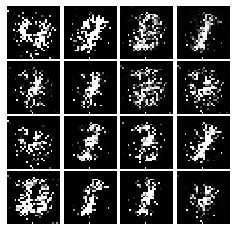

Epoch: 2, Iter: 1220, D: 0.1699, G:0.4386


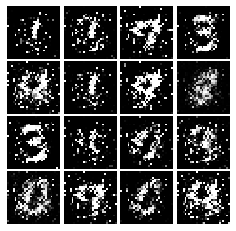

Epoch: 2, Iter: 1240, D: 0.1685, G:0.2491


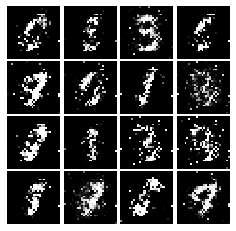

Epoch: 2, Iter: 1260, D: 0.1688, G:0.3364


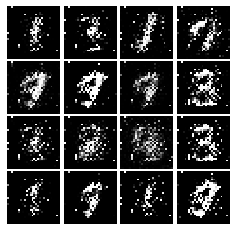

Epoch: 2, Iter: 1280, D: 0.3097, G:0.1637


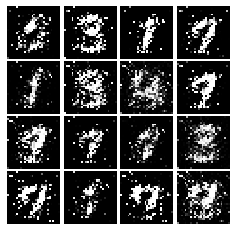

Epoch: 2, Iter: 1300, D: 0.1467, G:0.4296


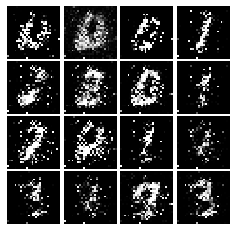

Epoch: 2, Iter: 1320, D: 0.1482, G:0.2367


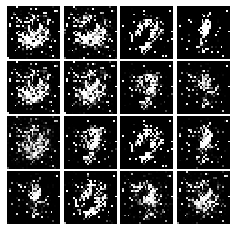

Epoch: 2, Iter: 1340, D: 0.1378, G:0.5228


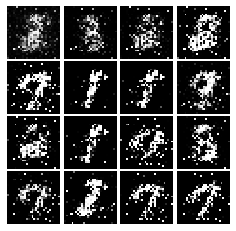

Epoch: 2, Iter: 1360, D: 0.1801, G:0.2944


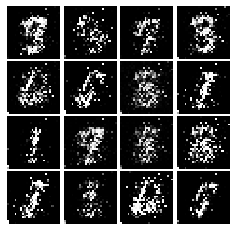

Epoch: 2, Iter: 1380, D: 0.1514, G:0.2242


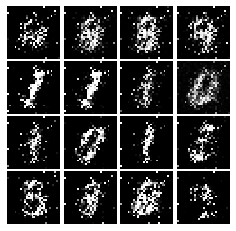

Epoch: 2, Iter: 1400, D: 0.1791, G:0.3052


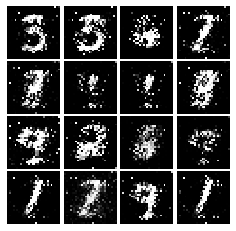

Epoch: 3, Iter: 1420, D: 0.2113, G:0.3244


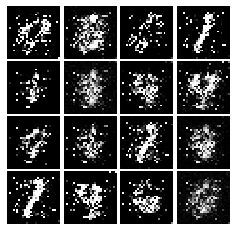

Epoch: 3, Iter: 1440, D: 0.1448, G:0.2922


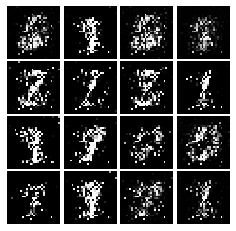

Epoch: 3, Iter: 1460, D: 0.1805, G:0.3645


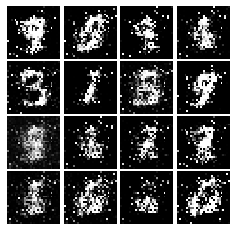

Epoch: 3, Iter: 1480, D: 0.1573, G:0.3364


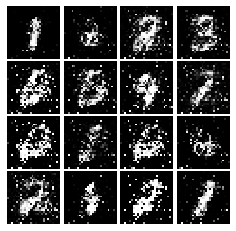

Epoch: 3, Iter: 1500, D: 0.1629, G:0.2397


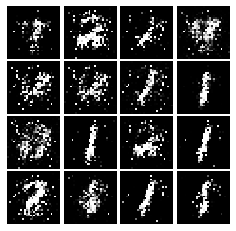

Epoch: 3, Iter: 1520, D: 0.2216, G:0.2329


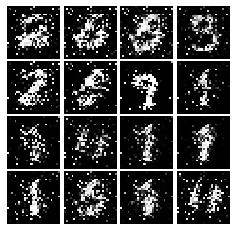

Epoch: 3, Iter: 1540, D: 0.1524, G:0.3943


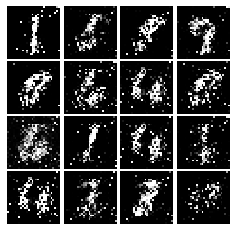

Epoch: 3, Iter: 1560, D: 0.1825, G:0.3047


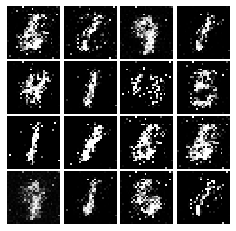

Epoch: 3, Iter: 1580, D: 0.206, G:0.2439


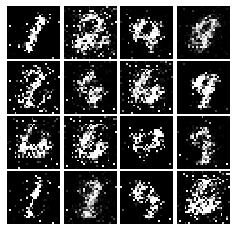

Epoch: 3, Iter: 1600, D: 0.1771, G:0.2403


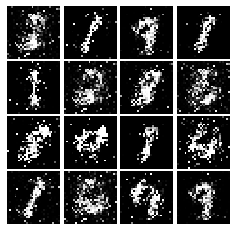

Epoch: 3, Iter: 1620, D: 0.1527, G:0.2709


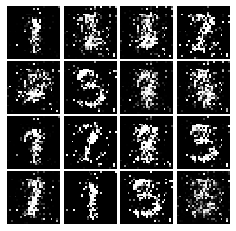

Epoch: 3, Iter: 1640, D: 0.1417, G:0.3149


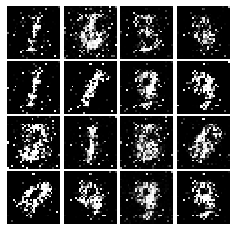

Epoch: 3, Iter: 1660, D: 0.1702, G:0.2676


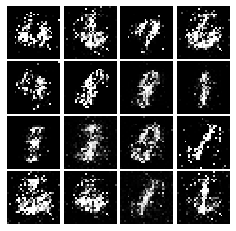

Epoch: 3, Iter: 1680, D: 0.1989, G:0.2953


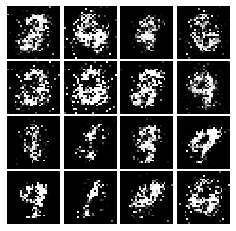

Epoch: 3, Iter: 1700, D: 0.242, G:0.1599


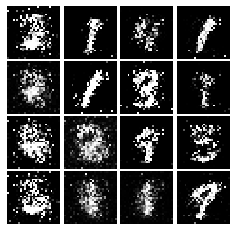

Epoch: 3, Iter: 1720, D: 0.1876, G:0.2268


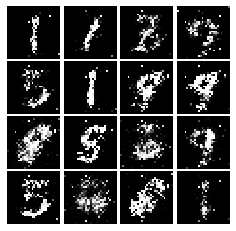

Epoch: 3, Iter: 1740, D: 0.216, G:0.2561


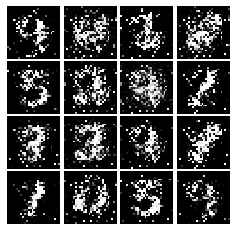

Epoch: 3, Iter: 1760, D: 0.1458, G:0.2978


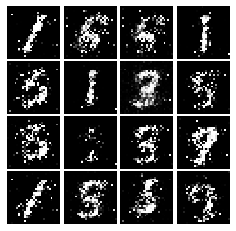

Epoch: 3, Iter: 1780, D: 0.1977, G:0.3011


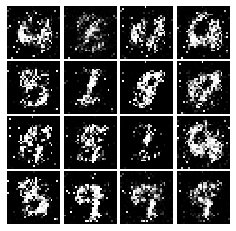

Epoch: 3, Iter: 1800, D: 0.2062, G:0.2548


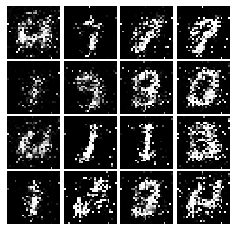

Epoch: 3, Iter: 1820, D: 0.2223, G:0.1949


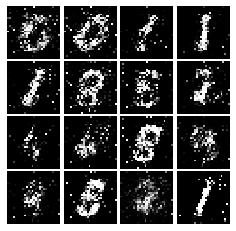

Epoch: 3, Iter: 1840, D: 0.214, G:0.2007


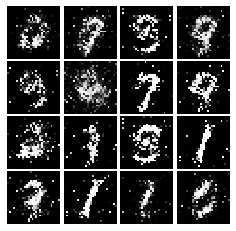

Epoch: 3, Iter: 1860, D: 0.2127, G:0.2063


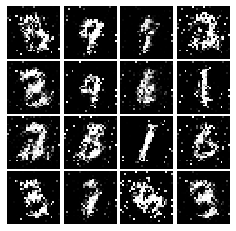

Epoch: 4, Iter: 1880, D: 0.1883, G:0.1894


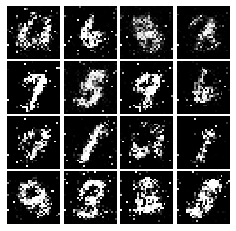

Epoch: 4, Iter: 1900, D: 0.2102, G:0.191


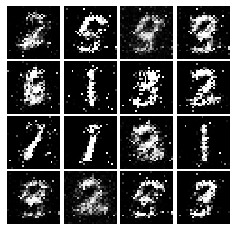

Epoch: 4, Iter: 1920, D: 0.2322, G:0.2063


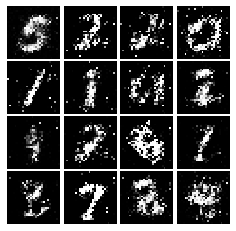

Epoch: 4, Iter: 1940, D: 0.2087, G:0.1912


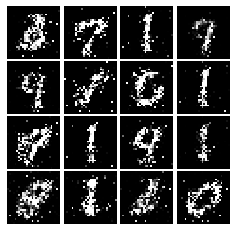

Epoch: 4, Iter: 1960, D: 0.1927, G:0.2075


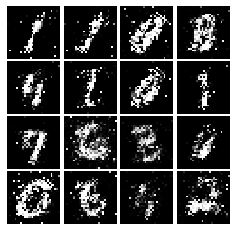

Epoch: 4, Iter: 1980, D: 0.2097, G:0.2191


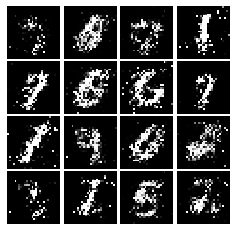

Epoch: 4, Iter: 2000, D: 0.2037, G:0.1861


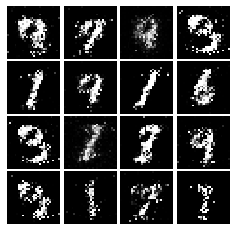

Epoch: 4, Iter: 2020, D: 0.2077, G:0.195


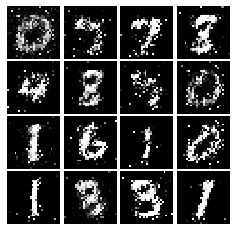

Epoch: 4, Iter: 2040, D: 0.2605, G:0.1266


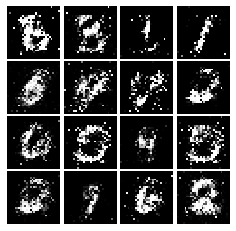

Epoch: 4, Iter: 2060, D: 0.2364, G:0.2122


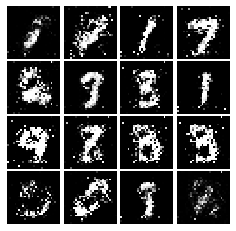

Epoch: 4, Iter: 2080, D: 0.2007, G:0.1885


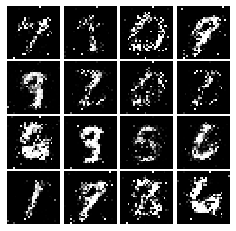

Epoch: 4, Iter: 2100, D: 0.2294, G:0.2163


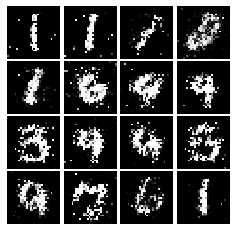

Epoch: 4, Iter: 2120, D: 0.215, G:0.1988


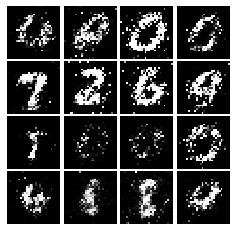

Epoch: 4, Iter: 2140, D: 0.2166, G:0.1756


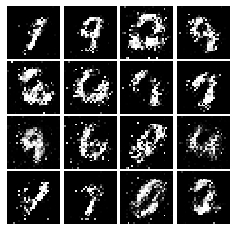

Epoch: 4, Iter: 2160, D: 0.2358, G:0.1859


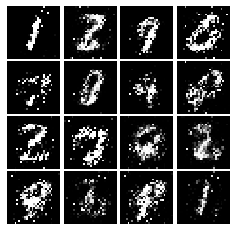

Epoch: 4, Iter: 2180, D: 0.2076, G:0.2128


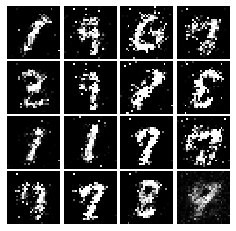

Epoch: 4, Iter: 2200, D: 0.2103, G:0.2652


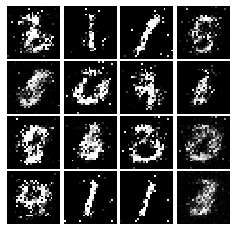

Epoch: 4, Iter: 2220, D: 0.2021, G:0.1999


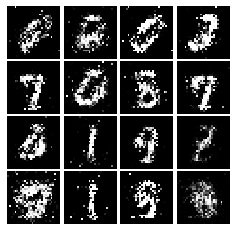

Epoch: 4, Iter: 2240, D: 0.2188, G:0.1771


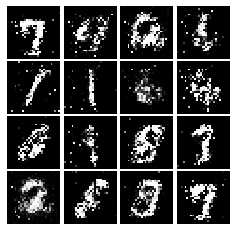

Epoch: 4, Iter: 2260, D: 0.1982, G:0.2277


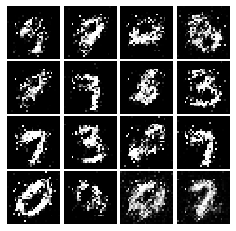

Epoch: 4, Iter: 2280, D: 0.2287, G:0.2049


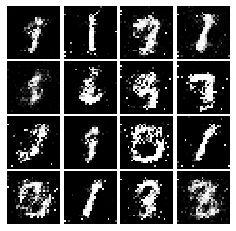

Epoch: 4, Iter: 2300, D: 0.236, G:0.2543


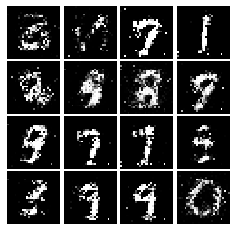

Epoch: 4, Iter: 2320, D: 0.207, G:0.185


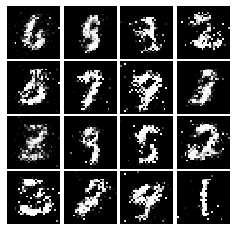

Epoch: 4, Iter: 2340, D: 0.2096, G:0.2024


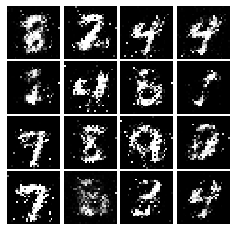

Epoch: 5, Iter: 2360, D: 0.1905, G:0.2541


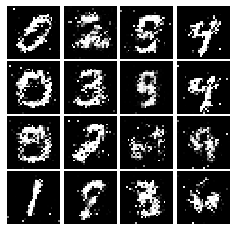

Epoch: 5, Iter: 2380, D: 0.2102, G:0.1778


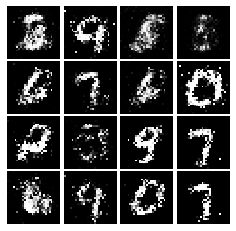

Epoch: 5, Iter: 2400, D: 0.2309, G:0.2109


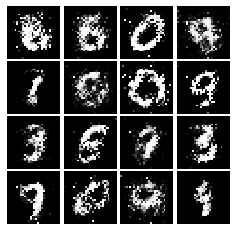

Epoch: 5, Iter: 2420, D: 0.2329, G:0.176


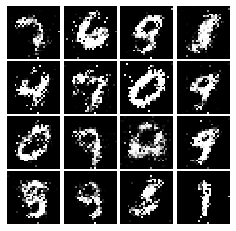

Epoch: 5, Iter: 2440, D: 0.2099, G:0.1709


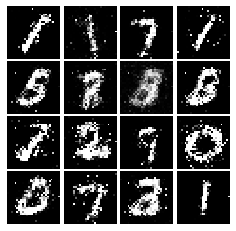

Epoch: 5, Iter: 2460, D: 0.2094, G:0.2142


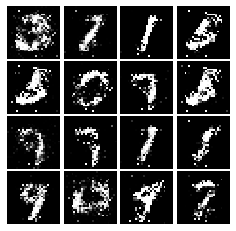

Epoch: 5, Iter: 2480, D: 0.2135, G:0.2025


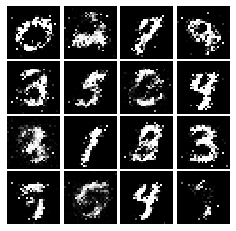

Epoch: 5, Iter: 2500, D: 0.2357, G:0.216


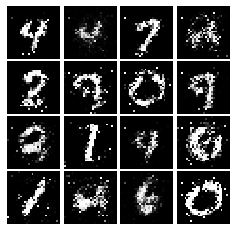

Epoch: 5, Iter: 2520, D: 0.2442, G:0.1487


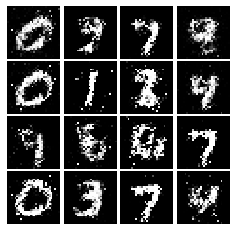

Epoch: 5, Iter: 2540, D: 0.2279, G:0.1931


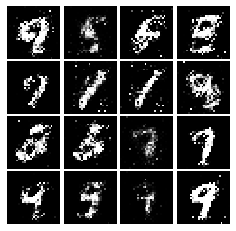

Epoch: 5, Iter: 2560, D: 0.2357, G:0.1917


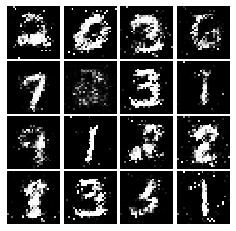

Epoch: 5, Iter: 2580, D: 0.2372, G:0.2037


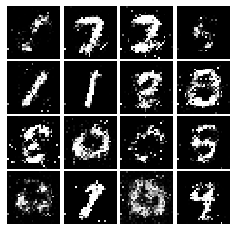

Epoch: 5, Iter: 2600, D: 0.2336, G:0.1649


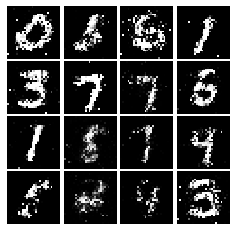

Epoch: 5, Iter: 2620, D: 0.2191, G:0.1861


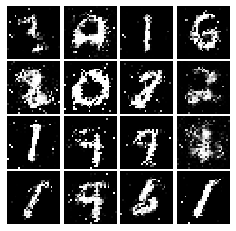

Epoch: 5, Iter: 2640, D: 0.1959, G:0.1982


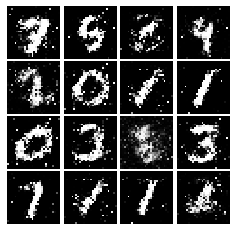

Epoch: 5, Iter: 2660, D: 0.2221, G:0.1823


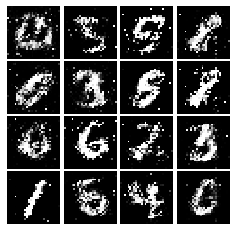

Epoch: 5, Iter: 2680, D: 0.2318, G:0.1707


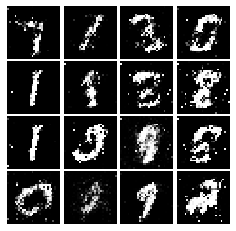

Epoch: 5, Iter: 2700, D: 0.2101, G:0.1621


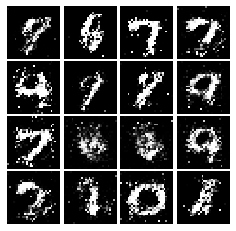

Epoch: 5, Iter: 2720, D: 0.2145, G:0.1948


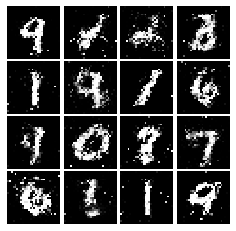

Epoch: 5, Iter: 2740, D: 0.2256, G:0.1816


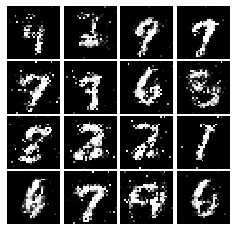

Epoch: 5, Iter: 2760, D: 0.264, G:0.2001


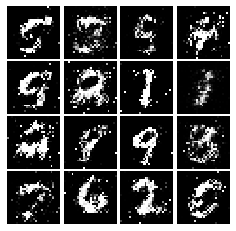

Epoch: 5, Iter: 2780, D: 0.2294, G:0.1796


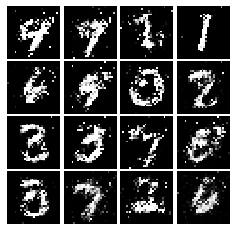

Epoch: 5, Iter: 2800, D: 0.1925, G:0.1739


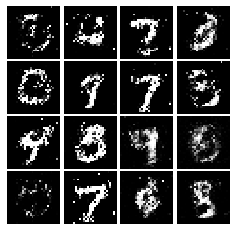

Epoch: 6, Iter: 2820, D: 0.2164, G:0.1918


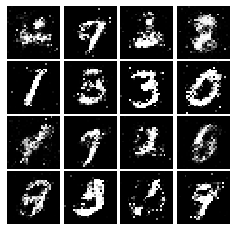

Epoch: 6, Iter: 2840, D: 0.2153, G:0.1833


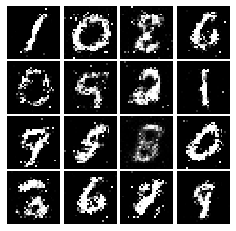

Epoch: 6, Iter: 2860, D: 0.2084, G:0.2218


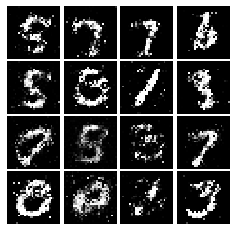

Epoch: 6, Iter: 2880, D: 0.1905, G:0.2441


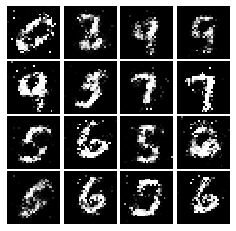

Epoch: 6, Iter: 2900, D: 0.2133, G:0.2043


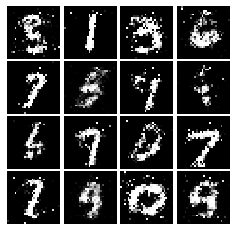

Epoch: 6, Iter: 2920, D: 0.2296, G:0.178


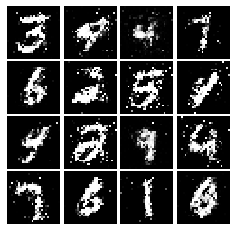

Epoch: 6, Iter: 2940, D: 0.2286, G:0.1662


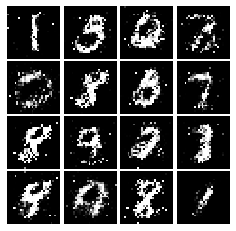

Epoch: 6, Iter: 2960, D: 0.2346, G:0.1741


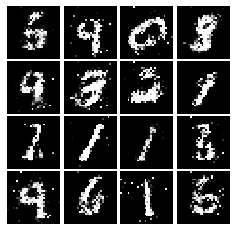

Epoch: 6, Iter: 2980, D: 0.2257, G:0.179


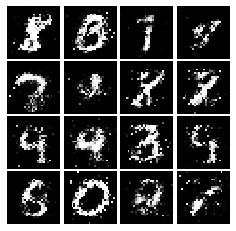

Epoch: 6, Iter: 3000, D: 0.2152, G:0.185


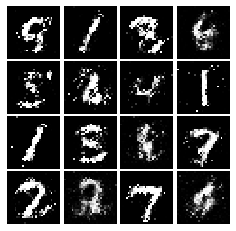

Epoch: 6, Iter: 3020, D: 0.2215, G:0.1644


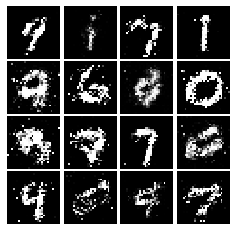

Epoch: 6, Iter: 3040, D: 0.2243, G:0.2427


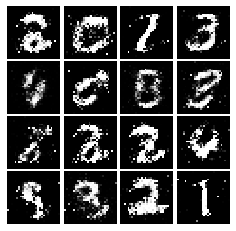

Epoch: 6, Iter: 3060, D: 0.2474, G:0.1557


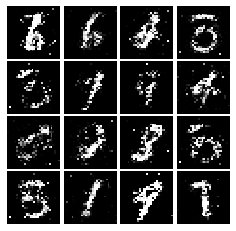

Epoch: 6, Iter: 3080, D: 0.2229, G:0.2316


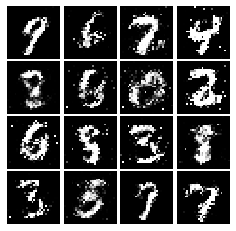

Epoch: 6, Iter: 3100, D: 0.2143, G:0.1558


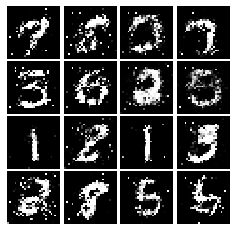

Epoch: 6, Iter: 3120, D: 0.2173, G:0.193


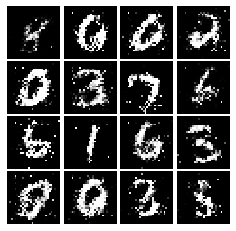

Epoch: 6, Iter: 3140, D: 0.2456, G:0.1752


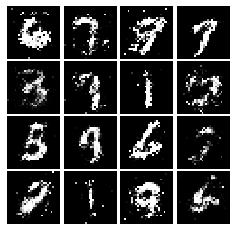

Epoch: 6, Iter: 3160, D: 0.2089, G:0.2038


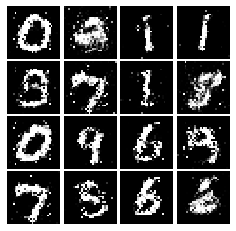

Epoch: 6, Iter: 3180, D: 0.226, G:0.1984


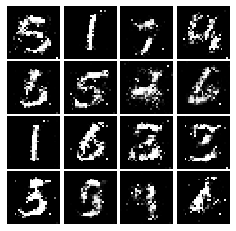

Epoch: 6, Iter: 3200, D: 0.2322, G:0.2028


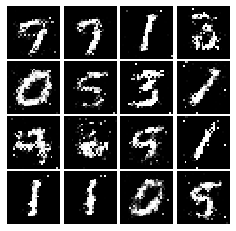

Epoch: 6, Iter: 3220, D: 0.2256, G:0.2118


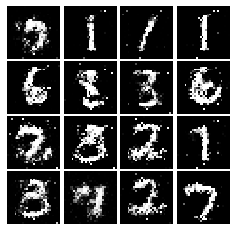

Epoch: 6, Iter: 3240, D: 0.2055, G:0.2361


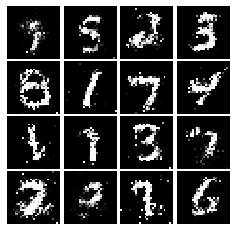

Epoch: 6, Iter: 3260, D: 0.2459, G:0.1643


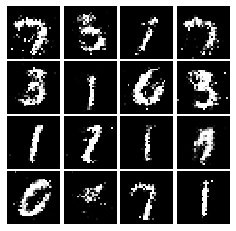

Epoch: 6, Iter: 3280, D: 0.2212, G:0.1943


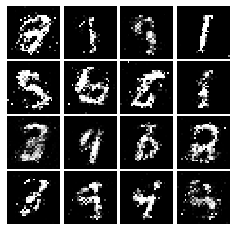

Epoch: 7, Iter: 3300, D: 0.2267, G:0.2149


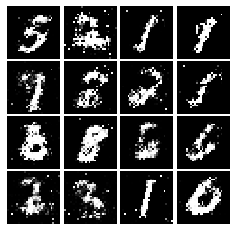

Epoch: 7, Iter: 3320, D: 0.2224, G:0.1754


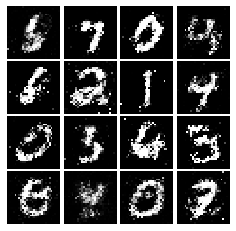

Epoch: 7, Iter: 3340, D: 0.2154, G:0.1848


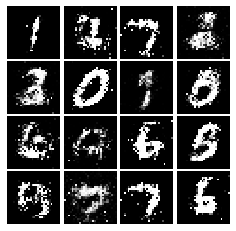

Epoch: 7, Iter: 3360, D: 0.2184, G:0.163


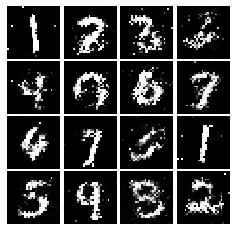

Epoch: 7, Iter: 3380, D: 0.2296, G:0.182


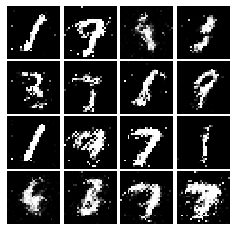

Epoch: 7, Iter: 3400, D: 0.2277, G:0.1477


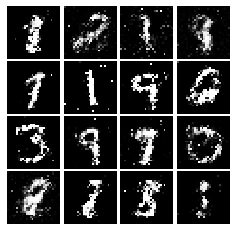

Epoch: 7, Iter: 3420, D: 0.2369, G:0.1788


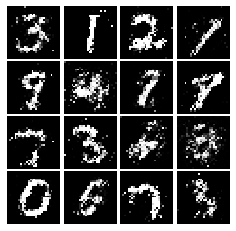

Epoch: 7, Iter: 3440, D: 0.1968, G:0.1735


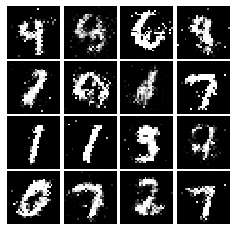

Epoch: 7, Iter: 3460, D: 0.2176, G:0.176


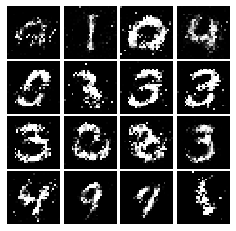

Epoch: 7, Iter: 3480, D: 0.2091, G:0.1883


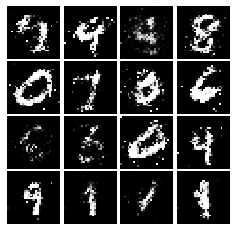

Epoch: 7, Iter: 3500, D: 0.2257, G:0.1616


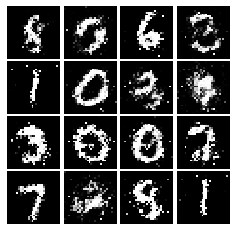

Epoch: 7, Iter: 3520, D: 0.2322, G:0.1924


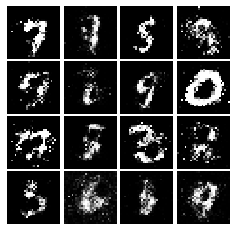

Epoch: 7, Iter: 3540, D: 0.2281, G:0.1659


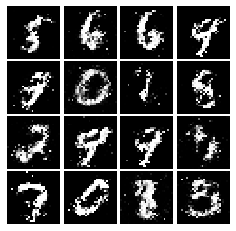

Epoch: 7, Iter: 3560, D: 0.2158, G:0.1913


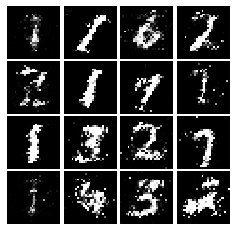

Epoch: 7, Iter: 3580, D: 0.2378, G:0.2037


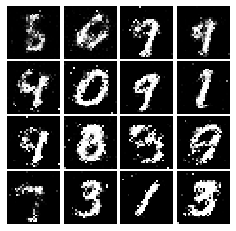

Epoch: 7, Iter: 3600, D: 0.238, G:0.1879


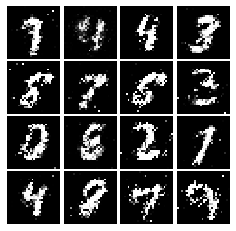

Epoch: 7, Iter: 3620, D: 0.2305, G:0.1599


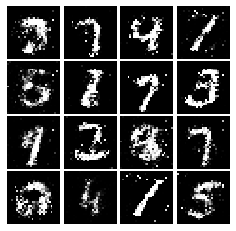

Epoch: 7, Iter: 3640, D: 0.2413, G:0.1712


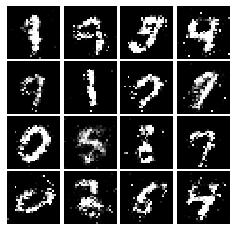

Epoch: 7, Iter: 3660, D: 0.2239, G:0.1686


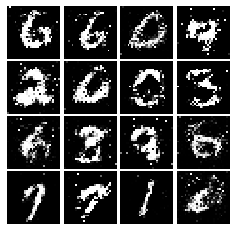

Epoch: 7, Iter: 3680, D: 0.2477, G:0.1726


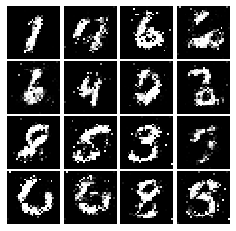

Epoch: 7, Iter: 3700, D: 0.2384, G:0.1693


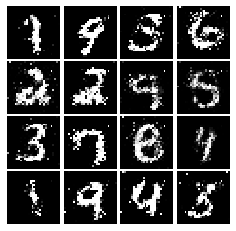

Epoch: 7, Iter: 3720, D: 0.2172, G:0.1698


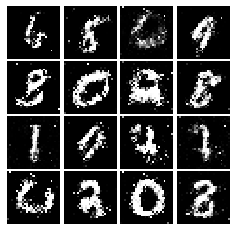

Epoch: 7, Iter: 3740, D: 0.2303, G:0.1759


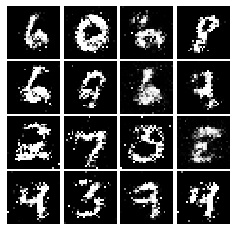

Epoch: 8, Iter: 3760, D: 0.2438, G:0.1956


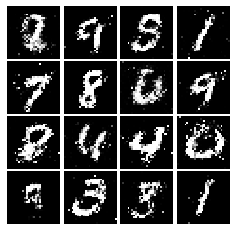

Epoch: 8, Iter: 3780, D: 0.2384, G:0.1749


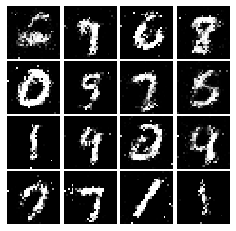

Epoch: 8, Iter: 3800, D: 0.2086, G:0.1641


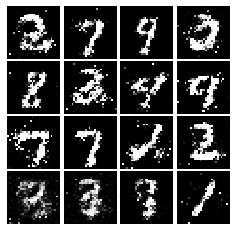

Epoch: 8, Iter: 3820, D: 0.2249, G:0.1578


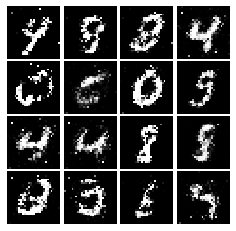

Epoch: 8, Iter: 3840, D: 0.2115, G:0.1489


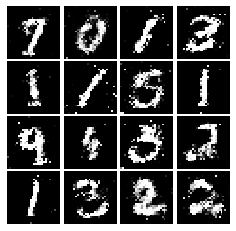

Epoch: 8, Iter: 3860, D: 0.2279, G:0.1589


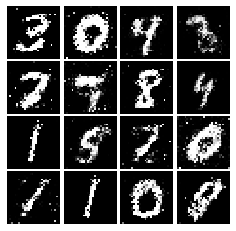

Epoch: 8, Iter: 3880, D: 0.2105, G:0.1623


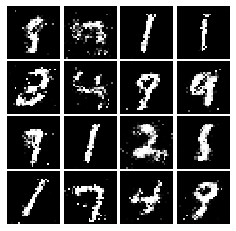

Epoch: 8, Iter: 3900, D: 0.2327, G:0.1768


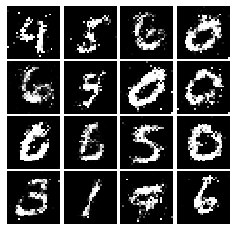

Epoch: 8, Iter: 3920, D: 0.2148, G:0.1606


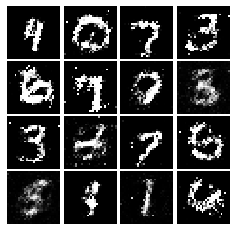

Epoch: 8, Iter: 3940, D: 0.2293, G:0.1721


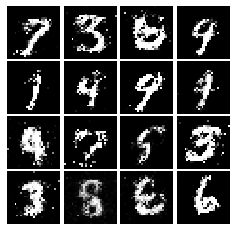

Epoch: 8, Iter: 3960, D: 0.2462, G:0.2031


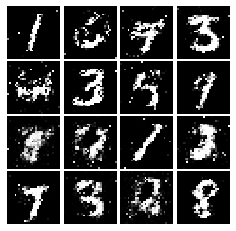

Epoch: 8, Iter: 3980, D: 0.2366, G:0.178


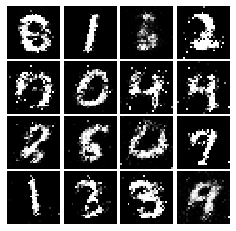

Epoch: 8, Iter: 4000, D: 0.2241, G:0.1869


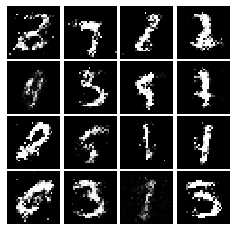

Epoch: 8, Iter: 4020, D: 0.2384, G:0.1597


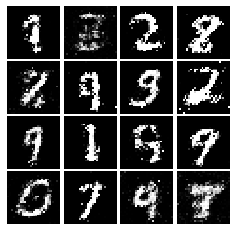

Epoch: 8, Iter: 4040, D: 0.2266, G:0.1778


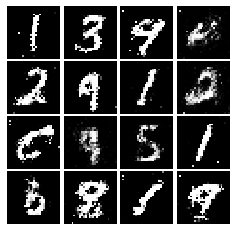

Epoch: 8, Iter: 4060, D: 0.2135, G:0.1605


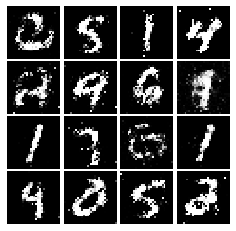

Epoch: 8, Iter: 4080, D: 0.2501, G:0.1784


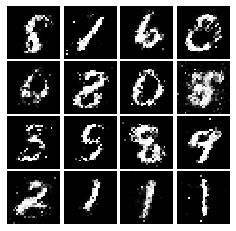

Epoch: 8, Iter: 4100, D: 0.2362, G:0.1769


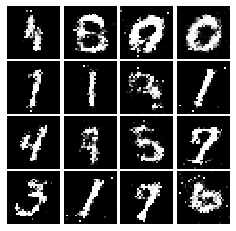

Epoch: 8, Iter: 4120, D: 0.2205, G:0.1636


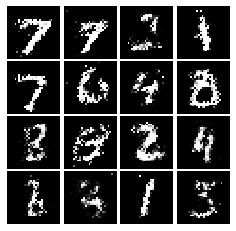

Epoch: 8, Iter: 4140, D: 0.2366, G:0.186


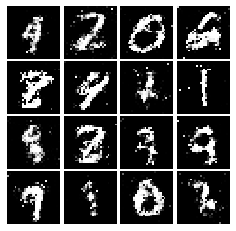

Epoch: 8, Iter: 4160, D: 0.2488, G:0.1862


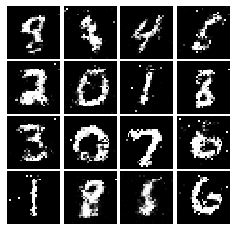

Epoch: 8, Iter: 4180, D: 0.2296, G:0.1938


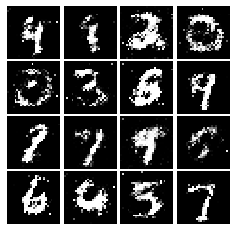

Epoch: 8, Iter: 4200, D: 0.2244, G:0.2054


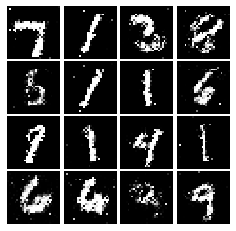

Epoch: 8, Iter: 4220, D: 0.2182, G:0.1865


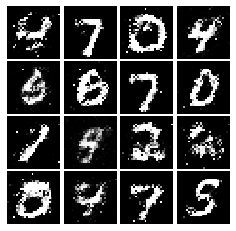

Epoch: 9, Iter: 4240, D: 0.2601, G:0.1736


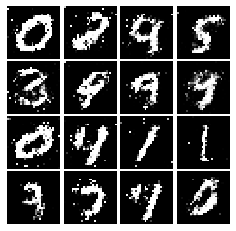

Epoch: 9, Iter: 4260, D: 0.2595, G:0.1407


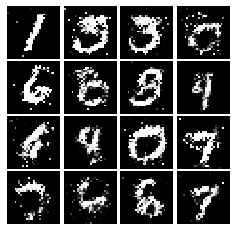

Epoch: 9, Iter: 4280, D: 0.2236, G:0.1808


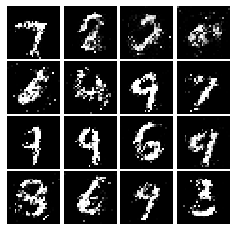

Epoch: 9, Iter: 4300, D: 0.248, G:0.163


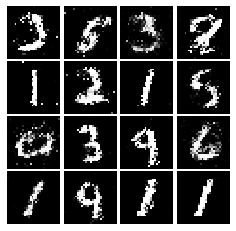

Epoch: 9, Iter: 4320, D: 0.2254, G:0.1572


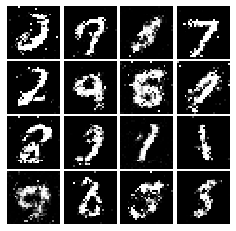

Epoch: 9, Iter: 4340, D: 0.2227, G:0.1701


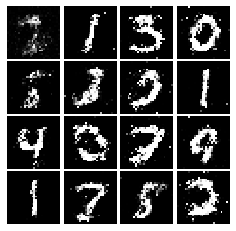

Epoch: 9, Iter: 4360, D: 0.2244, G:0.1493


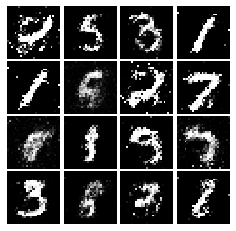

Epoch: 9, Iter: 4380, D: 0.237, G:0.1396


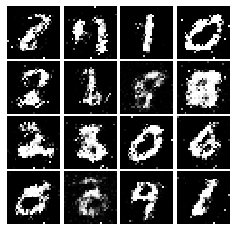

Epoch: 9, Iter: 4400, D: 0.2178, G:0.1795


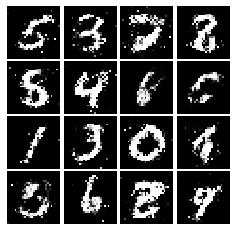

Epoch: 9, Iter: 4420, D: 0.2337, G:0.1635


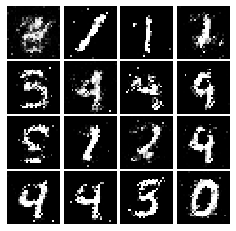

Epoch: 9, Iter: 4440, D: 0.246, G:0.1363


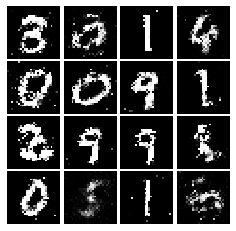

Epoch: 9, Iter: 4460, D: 0.2379, G:0.1557


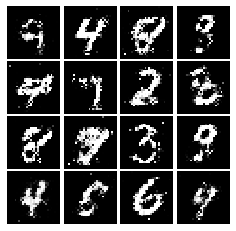

Epoch: 9, Iter: 4480, D: 0.2536, G:0.1867


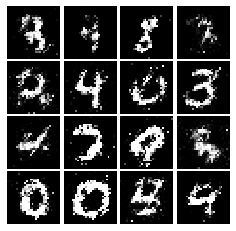

Epoch: 9, Iter: 4500, D: 0.2505, G:0.1679


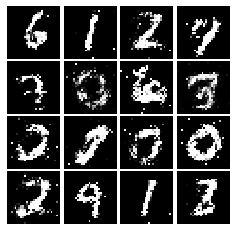

Epoch: 9, Iter: 4520, D: 0.2512, G:0.1533


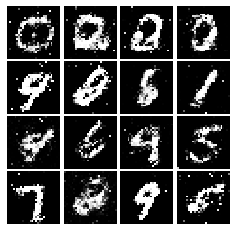

Epoch: 9, Iter: 4540, D: 0.2623, G:0.1551


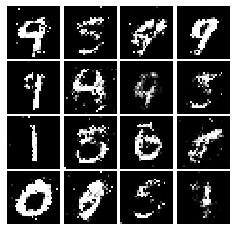

Epoch: 9, Iter: 4560, D: 0.2476, G:0.1749


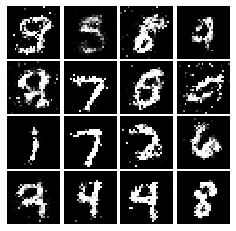

Epoch: 9, Iter: 4580, D: 0.2243, G:0.1832


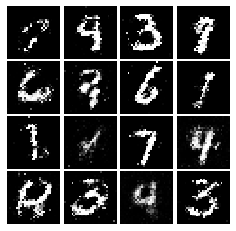

Epoch: 9, Iter: 4600, D: 0.246, G:0.1458


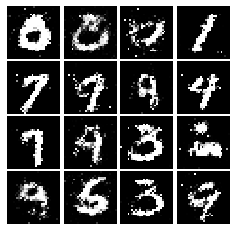

Epoch: 9, Iter: 4620, D: 0.2309, G:0.1837


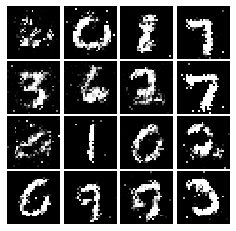

Epoch: 9, Iter: 4640, D: 0.2228, G:0.1431


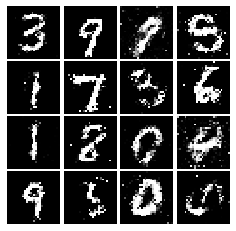

Epoch: 9, Iter: 4660, D: 0.2387, G:0.1624


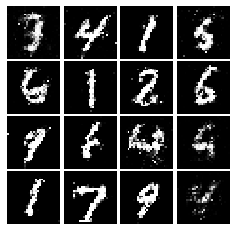

Epoch: 9, Iter: 4680, D: 0.2368, G:0.1752


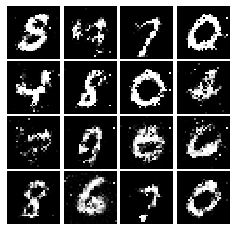

Final images


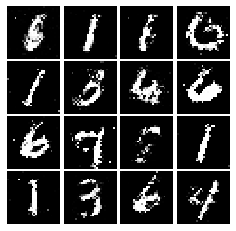

In [47]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [1]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer((784,)),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32, (5,5), strides = 1, padding ='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),2),
        tf.keras.layers.Conv2D(64, (5,5), strides = 1, padding ='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

NameError: name 'tf' is not defined

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [49]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer((noise_dim,)),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(64, (4,4), strides = 2, padding = 'SAME', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, (4,4), strides = 2, padding = 'SAME', activation='tanh')
        
    
        
    ])

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.475, G:0.654


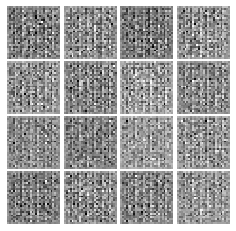

Epoch: 0, Iter: 20, D: 0.1401, G:2.391


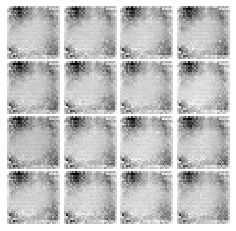

Epoch: 0, Iter: 40, D: 0.002736, G:6.007


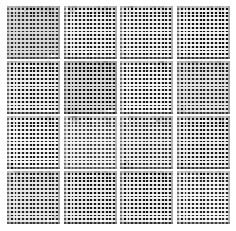

Epoch: 0, Iter: 60, D: 0.0009747, G:6.991


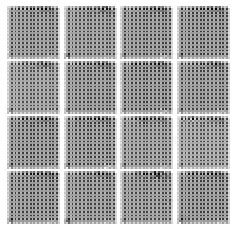

Epoch: 0, Iter: 80, D: 0.0005591, G:7.55


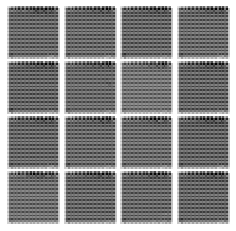

Epoch: 0, Iter: 100, D: 0.2033, G:2.405


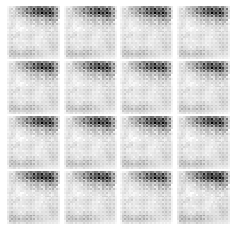

Epoch: 0, Iter: 120, D: 0.9952, G:0.6502


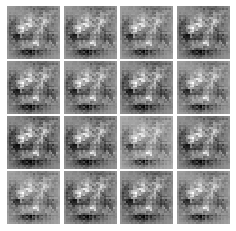

Epoch: 0, Iter: 140, D: 0.2157, G:3.392


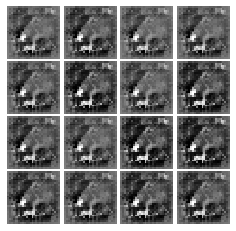

Epoch: 0, Iter: 160, D: 0.9031, G:1.2


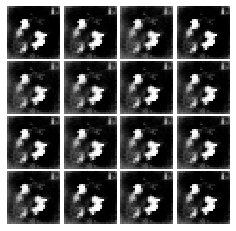

Epoch: 0, Iter: 180, D: 0.2183, G:3.569


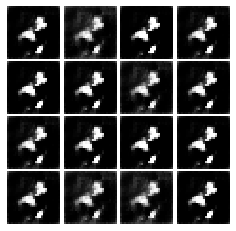

Epoch: 0, Iter: 200, D: 1.395, G:1.066


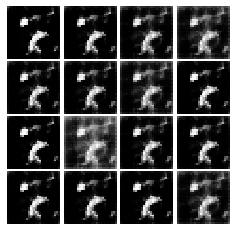

Epoch: 0, Iter: 220, D: 0.2234, G:3.138


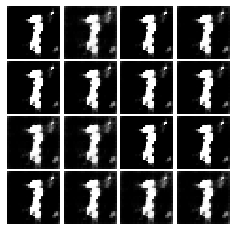

Epoch: 0, Iter: 240, D: 0.2515, G:2.711


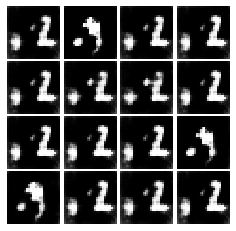

Epoch: 0, Iter: 260, D: 0.4802, G:3.429


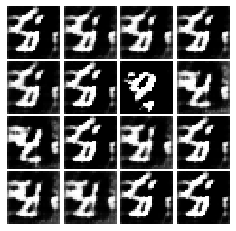

Epoch: 0, Iter: 280, D: 1.175, G:4.375


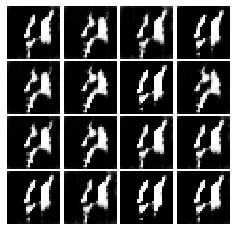

Epoch: 0, Iter: 300, D: 0.1318, G:3.755


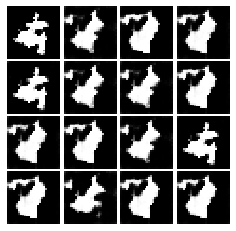

Epoch: 0, Iter: 320, D: 1.497, G:2.311


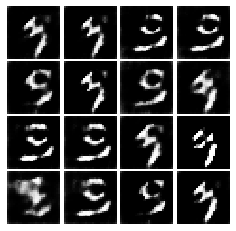

Epoch: 0, Iter: 340, D: 1.081, G:1.431


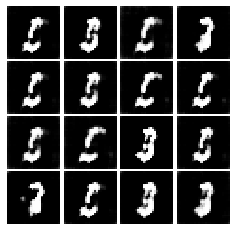

Epoch: 0, Iter: 360, D: 0.312, G:2.31


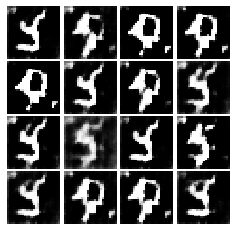

Epoch: 0, Iter: 380, D: 0.6455, G:1.144


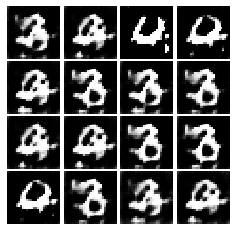

Epoch: 0, Iter: 400, D: 1.052, G:2.869


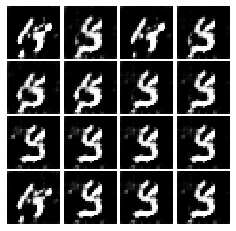

Epoch: 0, Iter: 420, D: 0.9469, G:5.859


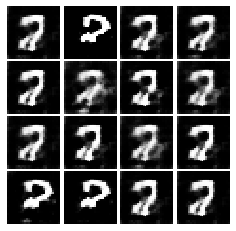

Epoch: 0, Iter: 440, D: 0.5651, G:2.703


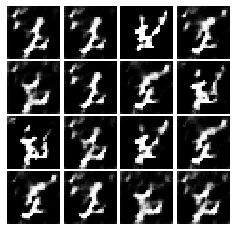

Epoch: 0, Iter: 460, D: 0.5055, G:2.564


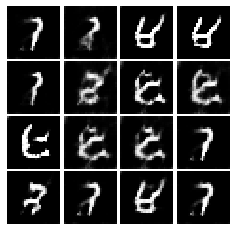

Epoch: 1, Iter: 480, D: 0.8017, G:1.695


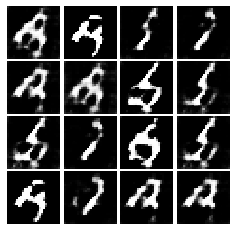

Epoch: 1, Iter: 500, D: 0.6345, G:2.54


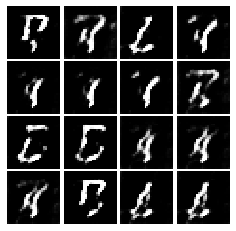

Epoch: 1, Iter: 520, D: 0.6062, G:2.516


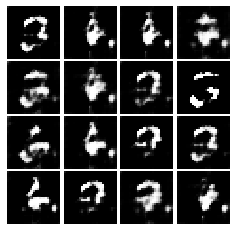

Epoch: 1, Iter: 540, D: 0.5306, G:2.162


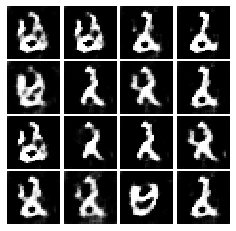

Epoch: 1, Iter: 560, D: 0.7661, G:2.72


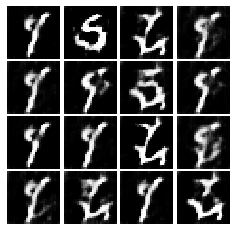

Epoch: 1, Iter: 580, D: 0.6376, G:2.138


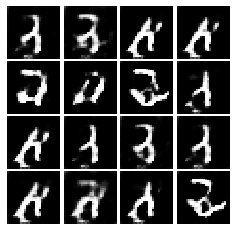

Epoch: 1, Iter: 600, D: 0.3861, G:2.29


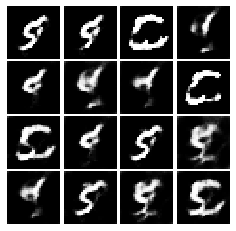

Epoch: 1, Iter: 620, D: 0.4515, G:3.727


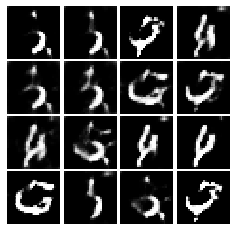

Epoch: 1, Iter: 640, D: 0.4847, G:3.428


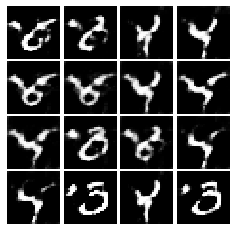

Epoch: 1, Iter: 660, D: 0.5306, G:2.788


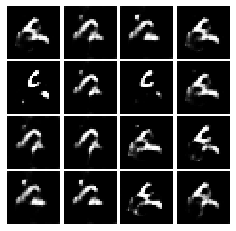

Epoch: 1, Iter: 680, D: 0.3737, G:3.338


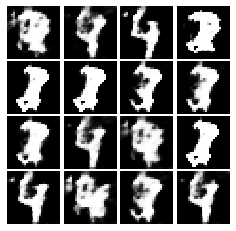

Epoch: 1, Iter: 700, D: 0.8596, G:6.82


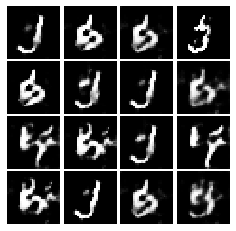

KeyboardInterrupt: 

In [50]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
